# Imports

In [2]:
import os
os.environ["GWPY_RCPARAMS"] = "False"
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from scipy.stats import gaussian_kde
from functions import (
    value_maker, data_loader, load_data, plot_2d, value_maker,
    generate_random_x_coordinates_below_curve, calculate_probability, 
    compute_probabilities, print_probs, plot_comparison,
    compare_multiple_runs, plot_bias_differences_by_parameter, plot_heatmap,
    plot_nd_heatmap, compute_nd_probabilities, plot_nd_comparison,
    compute_costs, print_costs, plot_costs,
    plot_cost_and_probability_comparison,
    bayes_factor, print_bayes_factor, bf_plotter
)

2025-05-12  10:32:35 PESummary WARNING : Could not find f_final in input file and one was not passed from the command line. Using 1024.0Hz as default
2025-05-12  10:32:35 PESummary WARNING : Could not find delta_f in input file and one was not passed from the command line. Using 0.00390625Hz as default
2025-05-12  10:32:35 PESummary WARNING : Could not find minimum frequency in input file and one was not passed from the command line. Using 20.0Hz as default
2025-05-12  10:32:36 PESummary INFO    : Averaging the final spin from the following fits: function bbh_final_spin_precessing_projected_UIB2016 at 0x7f445473a0e0, function bbh_final_spin_precessing_projected_Healyetal at 0x7f4454739f30, function bbh_final_spin_precessing_HBR2016 at 0x7f445473a290
2025-05-12  10:32:36 PESummary INFO    : Averaging the peak luminosity from the following fits: function bbh_peak_luminosity_non_precessing_UIB2016 at 0x7f445473a320, function bbh_peak_luminosity_non_precessing_Healyetal at 0x7f445473a3b0
2

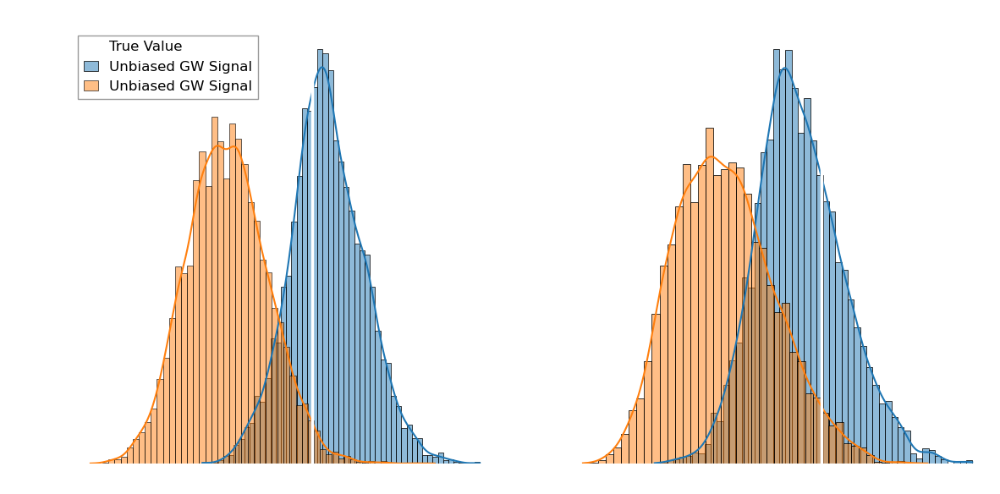

In [2]:
from pesummary.utils.samples_dict import MultiAnalysisSamplesDict
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Load data
data = MultiAnalysisSamplesDict.from_files({
    "unbiased": "total_mass/final_result/unbiased_M_300_data0_1126259642-413_analysis_H1L1V1_merge_result.json",
    "biased": "total_mass/final_result/biased_M_300_data0_1126259642-413_analysis_H1L1V1_merge_result.json",
}, disable_prior=True)

# Define parameters and true values
parameters = ["total_mass", "mass_ratio"]
true_values = [300, 1/4]

# Define colors
plot_colors = ["tab:blue", "tab:orange"]  # Colors for unbiased and biased data

# Create subplots
fig, axes = plt.subplots(1, 2, figsize=(12, 6), sharey=False)

# Plot distributions and true values
labels = ['Unbiased GW Signal', 'Biased GW Signal']
for i, (param, true_val) in enumerate(zip(parameters, true_values)):
    ax = axes[i]
    for j, (label, samples) in enumerate(data.items()):
        sns.histplot(samples[param], kde=True, color=plot_colors[j], label=labels[i], ax=ax, stat='density', edgecolor='black')
    
    # Add vertical line with label
    ax.axvline(true_val, color='white', linestyle='-', linewidth=2.5, label="True Value" if i == 0 else None)
    
    ax.set_title(param)
    ax.set_facecolor("none")
    ax.tick_params(axis='both', colors='white')
    ax.xaxis.label.set_color('white')
    ax.yaxis.label.set_color('white')
    ax.title.set_color('white')
    ax.grid(False)
    for spine in ax.spines.values():
        spine.set_color('white')

# Add legend to the first subplot (with true value line included)
axes[0].legend()

# Customize and save the figure
fig.patch.set_facecolor('none')
plt.tight_layout()
plt.savefig("comparison_side_by_side.pdf", transparent=True)
plt.show()

# Initialise the Data

In [3]:
mass_ratio_list = ['q_1', 'q_15', 'q_1_n1000', 'q_2', 'q_25', 'q_3', 'q_35', 'q_4', 'q_45', 'q_5']
label_list, parent_dir = ['unbiased', 'biased'], 'mass_ratio'
mass_ratio_data = load_data(mass_ratio_list, label_list, parent_dir)

2025-05-26  10:59:31 PESummary WARNING : Could not find f_final in input file and one was not passed from the command line. Using 1024.0Hz as default
2025-05-26  10:59:31 PESummary WARNING : Could not find delta_f in input file and one was not passed from the command line. Using 0.00390625Hz as default
2025-05-26  10:59:31 PESummary WARNING : Could not find minimum frequency in input file and one was not passed from the command line. Using 20.0Hz as default
2025-05-26  10:59:31 PESummary INFO    : Averaging the final spin from the following fits: function bbh_final_spin_precessing_projected_UIB2016 at 0x7f902e947f40, function bbh_final_spin_precessing_projected_Healyetal at 0x7f902e947d90, function bbh_final_spin_precessing_HBR2016 at 0x7f902e984160
2025-05-26  10:59:31 PESummary INFO    : Averaging the peak luminosity from the following fits: function bbh_peak_luminosity_non_precessing_UIB2016 at 0x7f902e9841f0, function bbh_peak_luminosity_non_precessing_Healyetal at 0x7f902e984280
2

In [4]:
q_1, q_1_injection_values = mass_ratio_data['q_1']
q_1_n1000, q_1_n1000_injection_values = mass_ratio_data['q_1_n1000']
q_15, q_15_injection_values = mass_ratio_data['q_15']
q_2, q_2_injection_values = mass_ratio_data['q_2']
q_25, q_25_injection_values = mass_ratio_data['q_25']
q_3, q_3_injection_values = mass_ratio_data['q_3']
q_35, q_35_injection_values = mass_ratio_data['q_35']
q_4, q_4_injection_values = mass_ratio_data['q_4']
q_45, q_45_injection_values = mass_ratio_data['q_45']
q_5, q_5_injection_values = mass_ratio_data['q_5']

In [5]:
mass_ratio_tilt_0_list = ['q_1_tilt_0', 'q_2_tilt_0', 'q_3_tilt_0', 'q_4_tilt_0', 'q_5_tilt_0']
label_list, parent_dir = ['unbiased', 'biased'], 'mass_ratio'
mass_ratio_tilt_0_data = load_data(mass_ratio_tilt_0_list, label_list, parent_dir)

2025-05-26  10:59:52 PESummary WARNING : Could not find f_final in input file and one was not passed from the command line. Using 1024.0Hz as default
2025-05-26  10:59:52 PESummary WARNING : Could not find delta_f in input file and one was not passed from the command line. Using 0.00390625Hz as default
2025-05-26  10:59:52 PESummary WARNING : Could not find minimum frequency in input file and one was not passed from the command line. Using 20.0Hz as default
2025-05-26  10:59:52 PESummary INFO    : chi_p = 0 for all samples. Treating this as a non-precessing system
2025-05-26  10:59:52 PESummary INFO    : Averaging the final spin from the following fits: function bbh_final_spin_precessing_projected_UIB2016 at 0x7f902e947f40, function bbh_final_spin_precessing_projected_Healyetal at 0x7f902e947d90, function bbh_final_spin_precessing_HBR2016 at 0x7f902e984160
2025-05-26  10:59:52 PESummary INFO    : Averaging the peak luminosity from the following fits: function bbh_peak_luminosity_non_pr

In [6]:
q_1_tilt_0, q_1_tilt_0_injection_values = mass_ratio_tilt_0_data['q_1_tilt_0']
q_2_tilt_0, q_2_tilt_0_injection_values = mass_ratio_tilt_0_data['q_2_tilt_0']
q_3_tilt_0, q_3_tilt_0_injection_values = mass_ratio_tilt_0_data['q_3_tilt_0']
q_4_tilt_0, q_4_tilt_0_injection_values = mass_ratio_tilt_0_data['q_4_tilt_0']
q_5_tilt_0, q_5_tilt_0_injection_values = mass_ratio_tilt_0_data['q_5_tilt_0']

In [7]:
total_mass_list = ['M_200', 'M_250', 'M_300', 'M_350', 'M_400', 'M_450']
label_list, parent_dir = ['unbiased', 'biased'], 'total_mass'
total_mass_data = load_data(total_mass_list, label_list, parent_dir)

2025-05-26  11:00:01 PESummary WARNING : Could not find f_final in input file and one was not passed from the command line. Using 1024.0Hz as default
2025-05-26  11:00:01 PESummary WARNING : Could not find delta_f in input file and one was not passed from the command line. Using 0.00390625Hz as default
2025-05-26  11:00:01 PESummary WARNING : Could not find minimum frequency in input file and one was not passed from the command line. Using 20.0Hz as default
2025-05-26  11:00:01 PESummary INFO    : Averaging the final spin from the following fits: function bbh_final_spin_precessing_projected_UIB2016 at 0x7f902e947f40, function bbh_final_spin_precessing_projected_Healyetal at 0x7f902e947d90, function bbh_final_spin_precessing_HBR2016 at 0x7f902e984160
2025-05-26  11:00:01 PESummary INFO    : Averaging the peak luminosity from the following fits: function bbh_peak_luminosity_non_precessing_UIB2016 at 0x7f902e9841f0, function bbh_peak_luminosity_non_precessing_Healyetal at 0x7f902e984280
2

In [8]:
M_200, M_200_injection_values = total_mass_data['M_200']
M_250, M_250_injection_values = total_mass_data['M_250']
M_300, M_300_injection_values = total_mass_data['M_300']
M_350, M_350_injection_values = total_mass_data['M_350']
M_400, M_400_injection_values = total_mass_data['M_400']
M_450, M_450_injection_values = total_mass_data['M_450']

In [9]:
# loc_M_350_freq_start = {"6Hz": "M_changing_freq_start/final_result/biased_M_350_freq_6_data0_1126259642-413_analysis_H1L1V1_merge_result.json",
#                         "10Hz": "M_changing_freq_start/final_result/biased_M_350_freq_10_data0_1126259642-413_analysis_H1L1V1_merge_result.json",
#                         "13Hz": "M_changing_freq_start/final_result/biased_M_350_freq_13_n1000_data0_1126259642-413_analysis_H1L1V1_merge_result.json",
#                         "18Hz": "M_changing_freq_start/final_result/biased_M_350_freq_18_n1000_data0_1126259642-413_analysis_H1L1V1_merge_result.json",}
# M_350_freq_start_data = data_loader(loc_M_350_freq_start, '13Hz', get_viewing_angle=False)
# M_350_freq_start, M_350_freq_start_injection_values = M_350_freq_start_data[0], M_350_freq_start_data[1]

# loc_M_400_freq_start = {"13Hz": "M_changing_freq_start/final_result/biased_M_400_freq_13_data0_1126259642-413_analysis_H1L1V1_merge_result.json",
#                         "18Hz": "M_changing_freq_start/final_result/biased_M_400_freq_18_data0_1126259642-413_analysis_H1L1V1_merge_result.json",}
# M_400_freq_start_data = data_loader(loc_M_400_freq_start, '13Hz', get_viewing_angle=False)
# M_400_freq_start, M_400_freq_start_injection_values = M_400_freq_start_data[0], M_400_freq_start_data[1]

In [10]:
SNR_list = ['SNR_30', 'SNR_35', 'SNR_40', 'SNR_45', 'SNR_50', 'SNR_55', 'SNR_60']
label_list, parent_dir = ['unbiased', 'biased'], 'SNR'
SNR_data = load_data(SNR_list, label_list, parent_dir)

2025-05-26  11:00:13 PESummary WARNING : Could not find f_final in input file and one was not passed from the command line. Using 1024.0Hz as default
2025-05-26  11:00:13 PESummary WARNING : Could not find delta_f in input file and one was not passed from the command line. Using 0.00390625Hz as default
2025-05-26  11:00:13 PESummary WARNING : Could not find minimum frequency in input file and one was not passed from the command line. Using 20.0Hz as default
2025-05-26  11:00:13 PESummary INFO    : Averaging the final spin from the following fits: function bbh_final_spin_precessing_projected_UIB2016 at 0x7f902e947f40, function bbh_final_spin_precessing_projected_Healyetal at 0x7f902e947d90, function bbh_final_spin_precessing_HBR2016 at 0x7f902e984160
2025-05-26  11:00:13 PESummary INFO    : Averaging the peak luminosity from the following fits: function bbh_peak_luminosity_non_precessing_UIB2016 at 0x7f902e9841f0, function bbh_peak_luminosity_non_precessing_Healyetal at 0x7f902e984280
2

In [11]:
SNR_30, SNR_30_injection_values = SNR_data['SNR_30']
SNR_35, SNR_35_injection_values = SNR_data['SNR_35']
SNR_40, SNR_40_injection_values = SNR_data['SNR_40']
SNR_45, SNR_45_injection_values = SNR_data['SNR_45']
SNR_50, SNR_50_injection_values = SNR_data['SNR_50']
SNR_55, SNR_55_injection_values = SNR_data['SNR_55']
SNR_60, SNR_60_injection_values = SNR_data['SNR_60']

In [12]:
injection_labels = ['chirp_mass', 'mass_ratio', 'a_1', 'a_2', 'tilt_1', 'tilt_2', 'phi_12', 'phi_jl',
                    'cos_theta_jn', 'psi', 'phase', 'geocent_time', 'luminosity_distance', 
                    'total_mass', 'mass_1', 'mass_2', 'theta_jn', 'ra', 'dec', 'symmetric_mass_ratio',
                    'iota', 'spin_1x', 'spin_1y', 'spin_1z', 'spin_2x', 'spin_2y', 'spin_2z',
                    'phi_1', 'phi_2', 'chi_eff', 'chi_p', 'cos_tilt_1', 'cos_tilt_2', 'redshift',
                    'comoving_distance', 'mass_1_source', 'mass_2_source', 'chirp_mass_source', 'total_mass_source']
keys = q_1['unbiased'].keys()
print(len(keys))
print(keys)

63
['chirp_mass', 'mass_ratio', 'a_1', 'a_2', 'tilt_1', 'tilt_2', 'phi_12', 'phi_jl', 'cos_theta_jn', 'psi', 'phase', 'azimuth', 'zenith', 'geocent_time', 'luminosity_distance', 'log_likelihood', 'log_prior', 'reference_frequency', 'minimum_frequency', 'total_mass', 'mass_1', 'mass_2', 'theta_jn', 'H1_log_likelihood', 'L1_log_likelihood', 'V1_log_likelihood', 'ra', 'dec', 'H1_matched_filter_snr', 'H1_optimal_snr', 'L1_matched_filter_snr', 'L1_optimal_snr', 'V1_matched_filter_snr', 'V1_optimal_snr', 'symmetric_mass_ratio', 'iota', 'spin_1x', 'spin_1y', 'spin_1z', 'spin_2x', 'spin_2y', 'spin_2z', 'phi_1', 'phi_2', 'chi_eff', 'chi_1_in_plane', 'chi_2_in_plane', 'chi_p', 'cos_tilt_1', 'cos_tilt_2', 'redshift', 'comoving_distance', 'mass_1_source', 'mass_2_source', 'chirp_mass_source', 'total_mass_source', 'H1_matched_filter_abs_snr', 'H1_matched_filter_snr_angle', 'L1_matched_filter_abs_snr', 'L1_matched_filter_snr_angle', 'V1_matched_filter_abs_snr', 'V1_matched_filter_snr_angle', 'viewin

# Plotting the Data

## Table Value Maker

In [16]:
value_maker(M_200, 'M=200', M_200_injection_values, params = ['a_1', 'a_2', 'luminosity_distance', 'total_mass', 'mass_ratio', 'chi_eff'])
value_maker(M_250, 'M=250', M_250_injection_values, params = ['a_1', 'a_2', 'luminosity_distance', 'total_mass', 'mass_ratio', 'chi_eff'])
value_maker(M_300, 'M=300', M_300_injection_values, params = ['a_1', 'a_2', 'luminosity_distance', 'total_mass', 'mass_ratio', 'chi_eff'])
value_maker(M_350, 'M=350', M_350_injection_values, params = ['a_1', 'a_2', 'luminosity_distance', 'total_mass', 'mass_ratio', 'chi_eff'])
value_maker(M_400, 'M=400', M_400_injection_values, params = ['a_1', 'a_2', 'luminosity_distance', 'total_mass', 'mass_ratio', 'chi_eff'])
value_maker(M_450, 'M=450', M_450_injection_values, params = ['a_1', 'a_2', 'luminosity_distance', 'total_mass', 'mass_ratio', 'chi_eff'])

--- unbiased M=200 ---
a_1: 0.6140134088960657 (+0.047871725187580205, -0.04653208933890307)
a_2: 0.5004165319857952 (+0.3889517809879903, -0.42447499057361693)
luminosity_distance: 824.6188701395022 (+79.35238131107155, -78.82619562918751)
total_mass: 200.3219896493158 (+3.7740939965888174, -3.849233781882049)
mass_ratio: 0.24846082663795713 (+0.02080303458472768, -0.017789348645387892)
chi_eff: 0.5428995660169543 (+0.06661998269607694, -0.05598825382299644)

--- biased M=200 ---
a_1: 0.6060044799807162 (+0.05282622156782091, -0.052455908910816196)
a_2: 0.4193482834963076 (+0.40996921576283296, -0.36568205976374635)
luminosity_distance: 822.0705597439025 (+84.51679740049269, -84.43479916126898)
total_mass: 199.57087270819616 (+5.109718533152261, -4.871604558677205)
mass_ratio: 0.2485037888556419 (+0.02543956573489148, -0.021426459875489745)
chi_eff: 0.5179318871440067 (+0.06792771530219155, -0.05549467934349067)

--- M=200 TRUE VALUES ---
a_1: 0.6
a_2: 0.6
luminosity_distance: 836.460

In [13]:
value_maker(q_1, 'q=1', q_1_injection_values, params = ['a_1', 'a_2', 'luminosity_distance', 'total_mass', 'mass_ratio', 'chi_eff'])
value_maker(q_2, 'q=2', q_2_injection_values, params = ['a_1', 'a_2', 'luminosity_distance', 'total_mass', 'mass_ratio', 'chi_eff'])
value_maker(q_3, 'q=3', q_3_injection_values, params = ['a_1', 'a_2', 'luminosity_distance', 'total_mass', 'mass_ratio', 'chi_eff'])
value_maker(q_4, 'q=4', q_4_injection_values, params = ['a_1', 'a_2', 'luminosity_distance', 'total_mass', 'mass_ratio', 'chi_eff'])
value_maker(q_5, 'q=5', q_5_injection_values, params = ['a_1', 'a_2', 'luminosity_distance', 'total_mass', 'mass_ratio', 'chi_eff'])

--- unbiased q=1 ---
a_1: 0.6314038472845681 (+0.2447239048651949, -0.22063175953729292)
a_2: 0.5896991499945825 (+0.2523674124434119, -0.2795290496024002)
luminosity_distance: 1516.6379563614294 (+263.6451833417548, -246.37493034254703)
total_mass: 301.3264848656571 (+6.046336325260199, -5.629537802596644)
mass_ratio: 0.9628438924144094 (+0.03376616271092581, -0.05127447890978587)
chi_eff: 0.5071317173838058 (+0.059639826342714364, -0.05707639785954688)

--- biased q=1 ---
a_1: 0.8734731904358889 (+0.10715032744827457, -0.16932984095132775)
a_2: 0.7317379687104246 (+0.2270419536556204, -0.3613096385298167)
luminosity_distance: 1032.1352701894095 (+170.67142023015163, -153.1041359614827)
total_mass: 285.40385039353197 (+6.100747771191493, -6.135164079810977)
mass_ratio: 0.9103969460811823 (+0.06930671878033534, -0.0692299589701677)
chi_eff: 0.3052187128029873 (+0.055212760396305904, -0.05736939117551648)

--- q=1 TRUE VALUES ---
a_1: 0.6
a_2: 0.6
luminosity_distance: 1465.7720851420588

In [14]:
value_maker(SNR_30, 'SNR=30', SNR_30_injection_values, params = ['a_1', 'a_2', 'luminosity_distance', 'total_mass', 'mass_ratio', 'chi_eff'])
value_maker(SNR_35, 'SNR=35', SNR_35_injection_values, params = ['a_1', 'a_2', 'luminosity_distance', 'total_mass', 'mass_ratio', 'chi_eff'])
value_maker(SNR_40, 'SNR=40', SNR_40_injection_values, params = ['a_1', 'a_2', 'luminosity_distance', 'total_mass', 'mass_ratio', 'chi_eff'])
value_maker(SNR_45, 'SNR=45', SNR_45_injection_values, params = ['a_1', 'a_2', 'luminosity_distance', 'total_mass', 'mass_ratio', 'chi_eff'])
value_maker(SNR_50, 'SNR=50', SNR_50_injection_values, params = ['a_1', 'a_2', 'luminosity_distance', 'total_mass', 'mass_ratio', 'chi_eff'])
value_maker(SNR_55, 'SNR=55', SNR_55_injection_values, params = ['a_1', 'a_2', 'luminosity_distance', 'total_mass', 'mass_ratio', 'chi_eff'])
value_maker(SNR_60, 'SNR=60', SNR_60_injection_values, params = ['a_1', 'a_2', 'luminosity_distance', 'total_mass', 'mass_ratio', 'chi_eff'])

--- unbiased SNR=30 ---
a_1: 0.6542573619062692 (+0.10089801736048243, -0.08879373774974775)
a_2: 0.41691770066597794 (+0.4590180811266485, -0.3788591380930463)
luminosity_distance: 1672.4474620983872 (+268.7534268842487, -260.7731373560416)
total_mass: 304.1956486572435 (+13.648265103306699, -12.711544630035803)
mass_ratio: 0.24728739672653244 (+0.03941183014074051, -0.034195579449812635)
chi_eff: 0.5194084135826811 (+0.09082184970305107, -0.07921825937456489)

--- biased SNR=30 ---
a_1: 0.5944513287750488 (+0.0979627504664401, -0.08444457733069066)
a_2: 0.4251114095537517 (+0.4554127919907901, -0.38515240797001205)
luminosity_distance: 1568.7594365055184 (+287.05450745960275, -283.7444198195758)
total_mass: 292.6135964690505 (+13.366876146536754, -13.003305840395)
mass_ratio: 0.2264565798970725 (+0.04508670205091128, -0.03800495957250777)
chi_eff: 0.47158972455839065 (+0.09240775406898216, -0.07625803649968377)

--- SNR=30 TRUE VALUES ---
a_1: 0.6
a_2: 0.6
luminosity_distance: 1669.5

## 2D Plots

### Mass Ratio

#### 0 Tilt

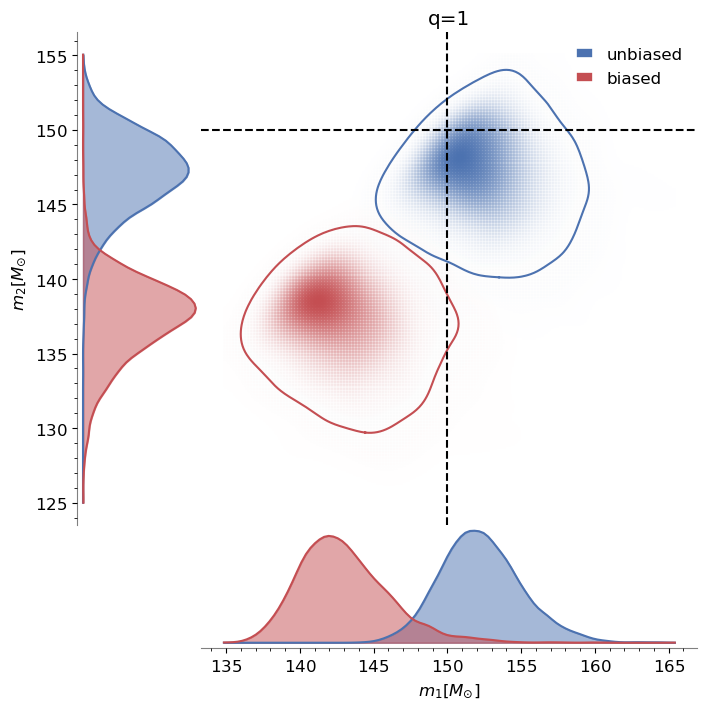

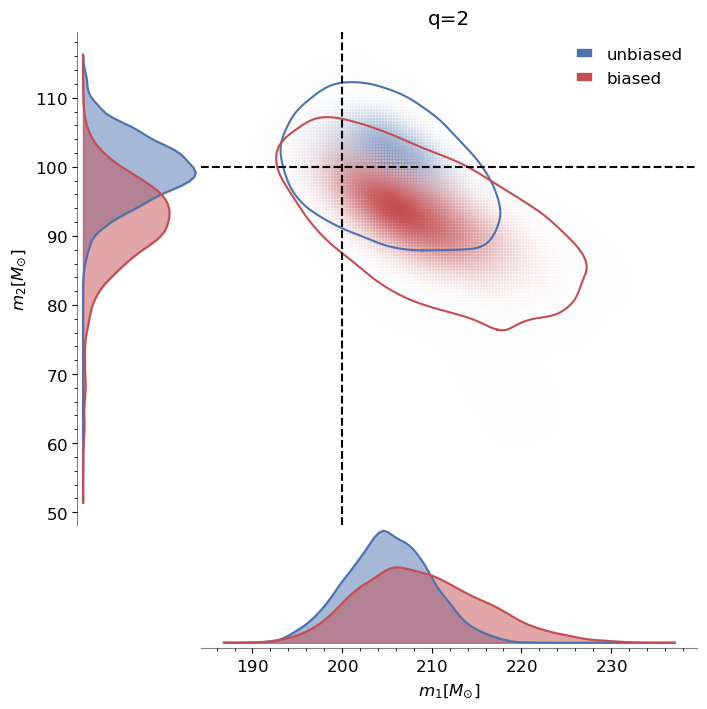

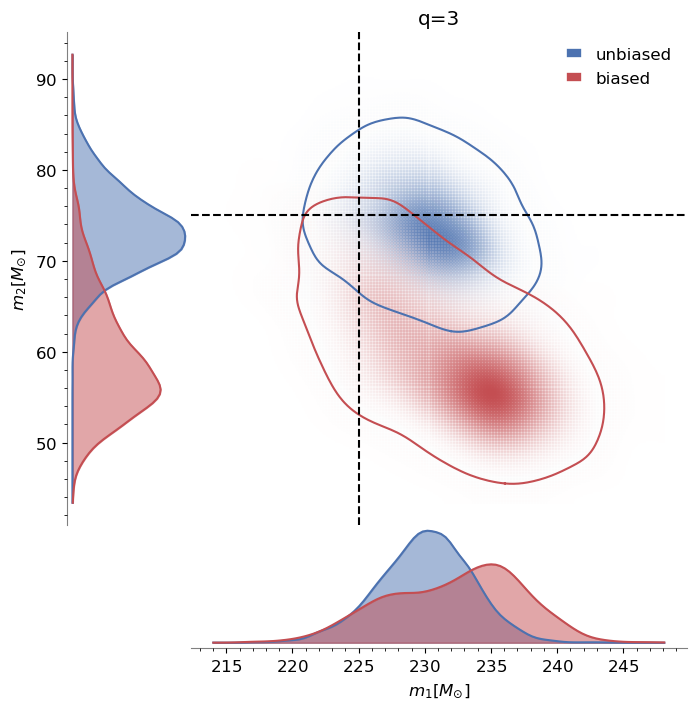

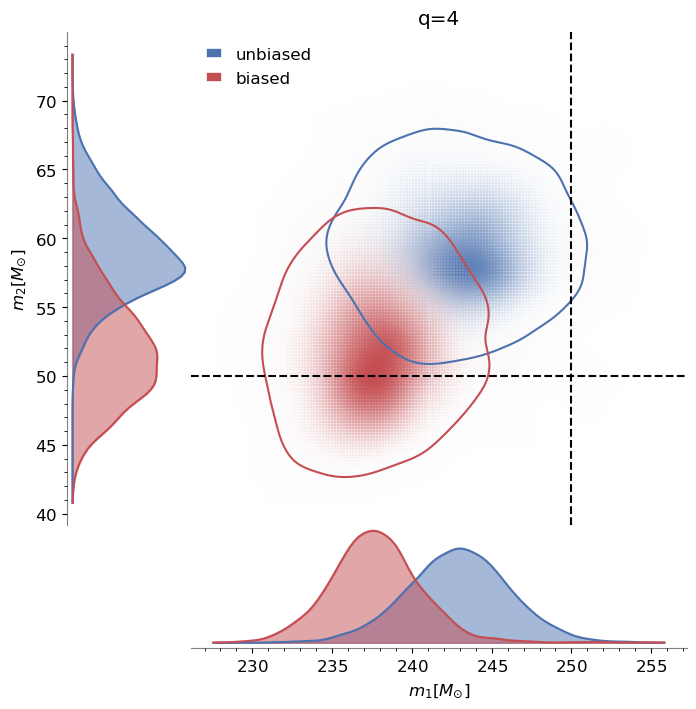

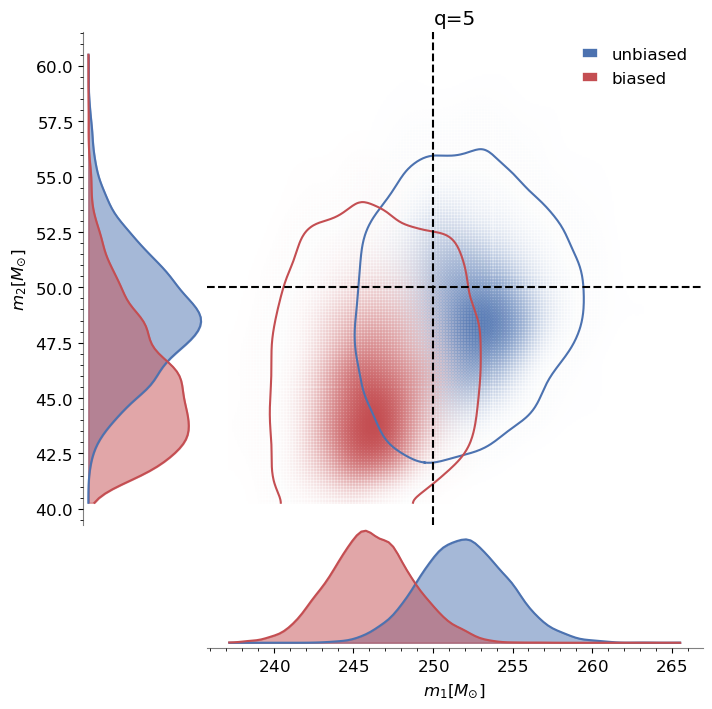

In [10]:
param_list = ['mass_1', 'mass_2']

plot_2d(q_1_tilt_0, q_1_tilt_0_injection_values, injection_labels, param_list, 'q=1')
plot_2d(q_2_tilt_0, q_2_tilt_0_injection_values, injection_labels, param_list, 'q=2')
plot_2d(q_3_tilt_0, q_3_tilt_0_injection_values, injection_labels, param_list, 'q=3')
plot_2d(q_4_tilt_0, q_4_tilt_0_injection_values, injection_labels, param_list, 'q=4')
plot_2d(q_5_tilt_0, q_5_tilt_0_injection_values, injection_labels, param_list, 'q=5')

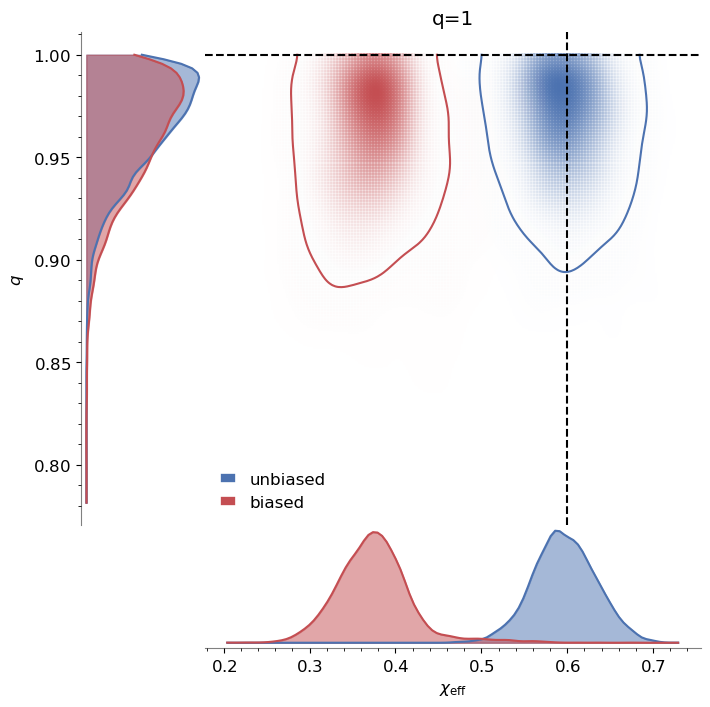

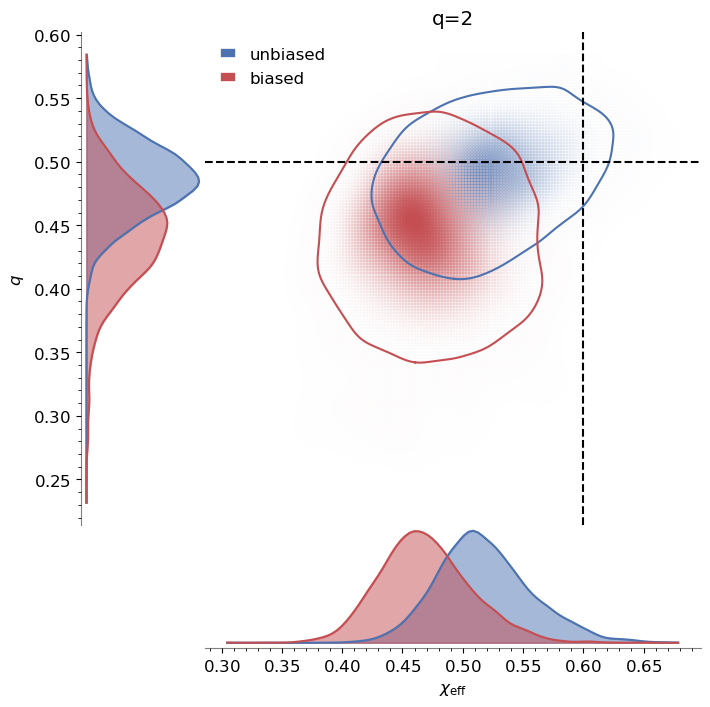

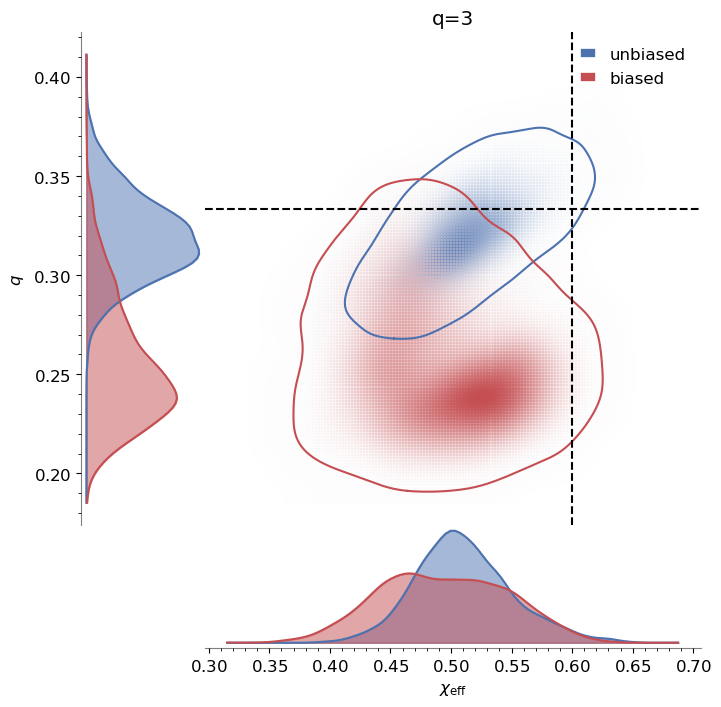

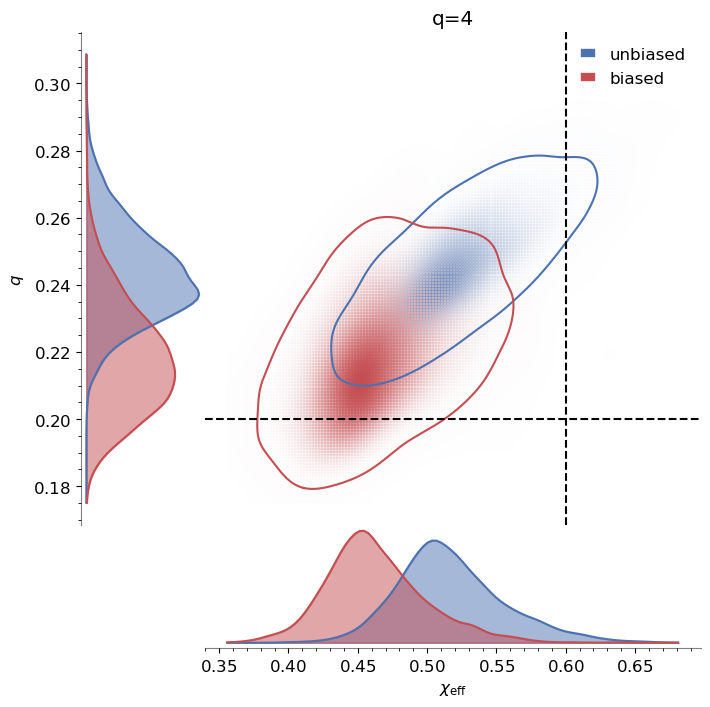

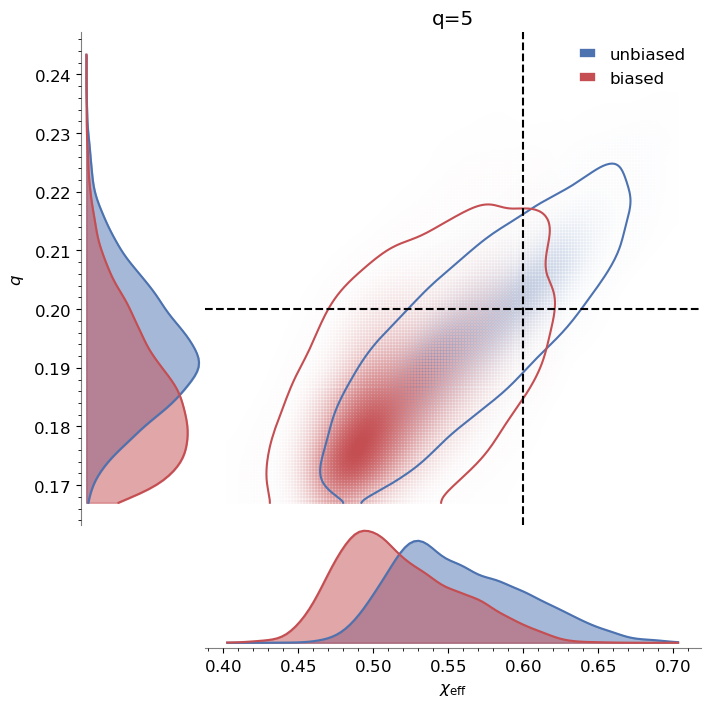

In [33]:
param_list = ['chi_eff', 'mass_ratio']

plot_2d(q_1_tilt_0, q_1_tilt_0_injection_values, injection_labels, param_list, 'q=1')
plot_2d(q_2_tilt_0, q_2_tilt_0_injection_values, injection_labels, param_list, 'q=2')
plot_2d(q_3_tilt_0, q_3_tilt_0_injection_values, injection_labels, param_list, 'q=3')
plot_2d(q_4_tilt_0, q_4_tilt_0_injection_values, injection_labels, param_list, 'q=4')
plot_2d(q_5_tilt_0, q_5_tilt_0_injection_values, injection_labels, param_list, 'q=5')

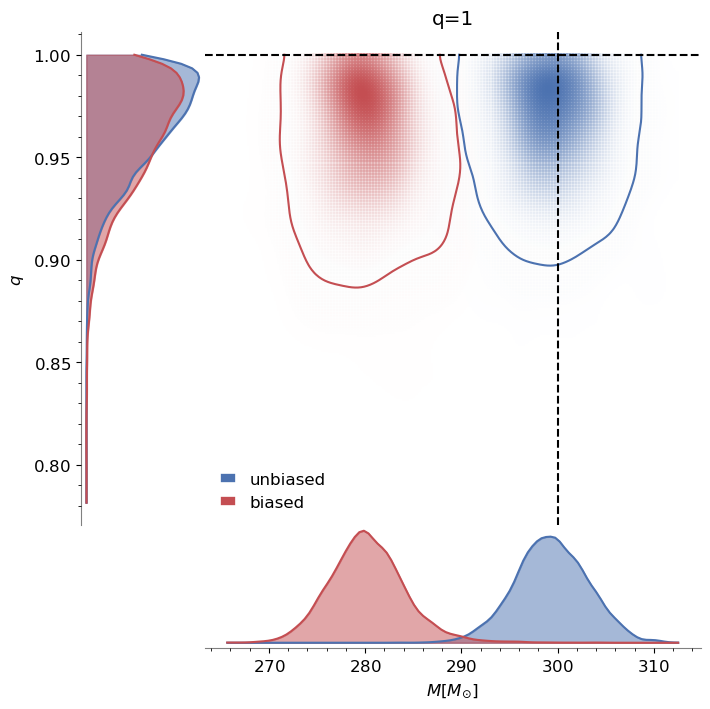

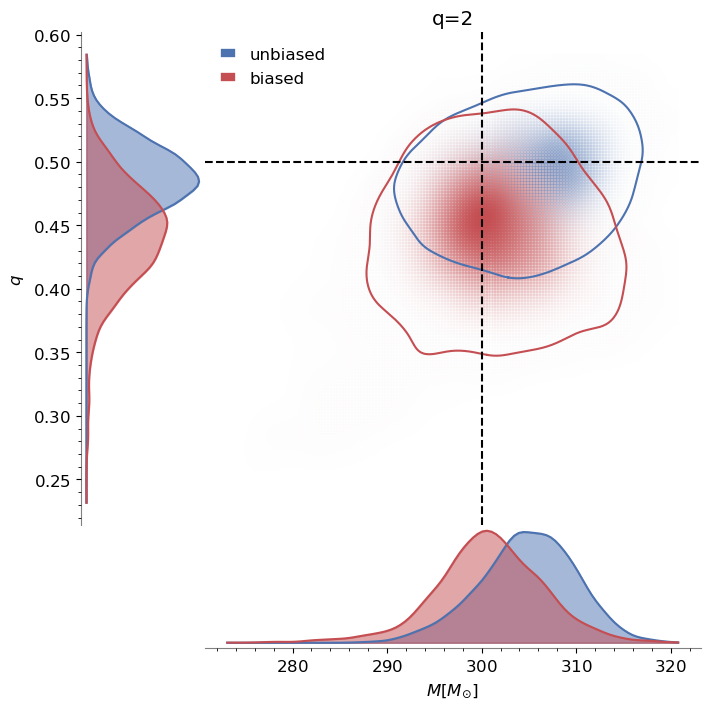

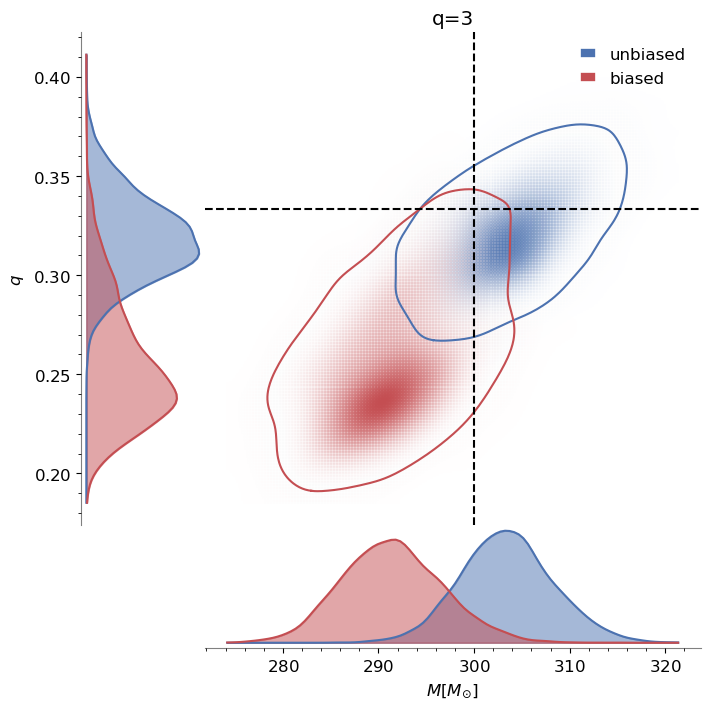

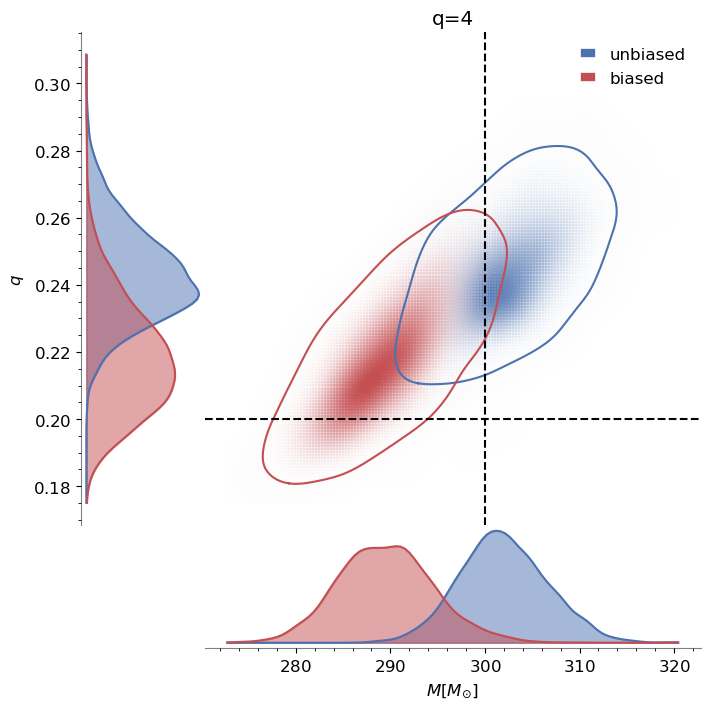

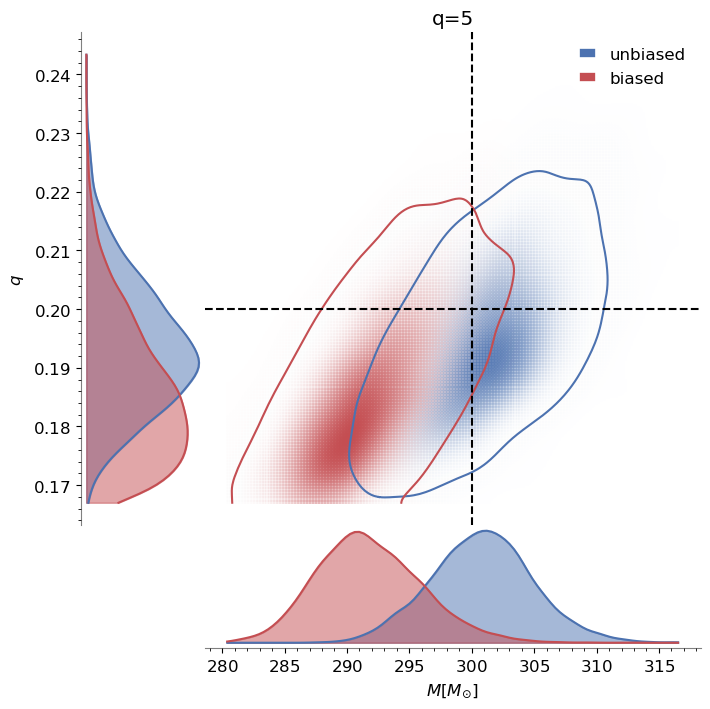

In [34]:
param_list = ['total_mass', 'mass_ratio']

plot_2d(q_1_tilt_0, q_1_tilt_0_injection_values, injection_labels, param_list, 'q=1')
plot_2d(q_2_tilt_0, q_2_tilt_0_injection_values, injection_labels, param_list, 'q=2')
plot_2d(q_3_tilt_0, q_3_tilt_0_injection_values, injection_labels, param_list, 'q=3')
plot_2d(q_4_tilt_0, q_4_tilt_0_injection_values, injection_labels, param_list, 'q=4')
plot_2d(q_5_tilt_0, q_5_tilt_0_injection_values, injection_labels, param_list, 'q=5')

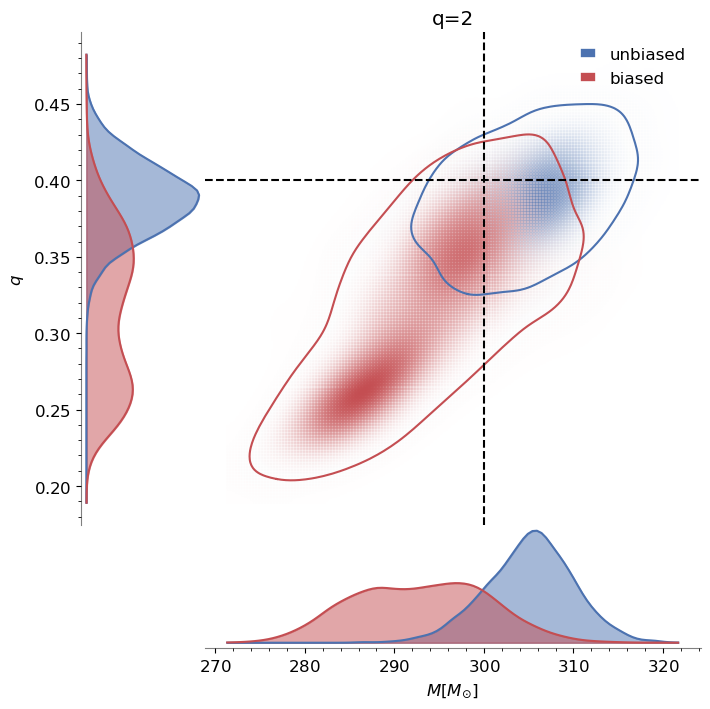

In [35]:
param_list = ['total_mass', 'mass_ratio']

plot_2d(q_2_freq_13, q_2_injection_values_freq_13, injection_labels, param_list, 'q=2')

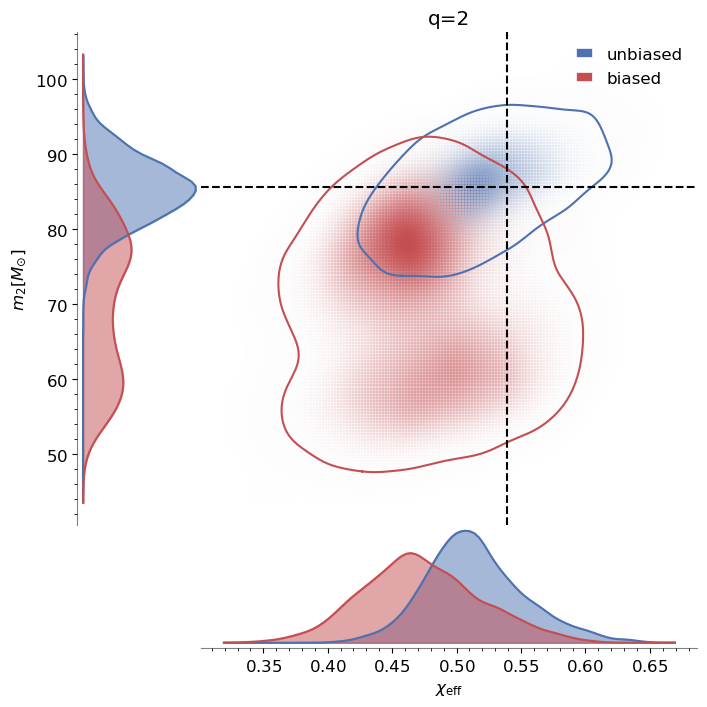

In [36]:
param_list = ['chi_eff', 'mass_2']

plot_2d(q_2_freq_13, q_2_injection_values_freq_13, injection_labels, param_list, 'q=2')

#### Varying Mass Ratio

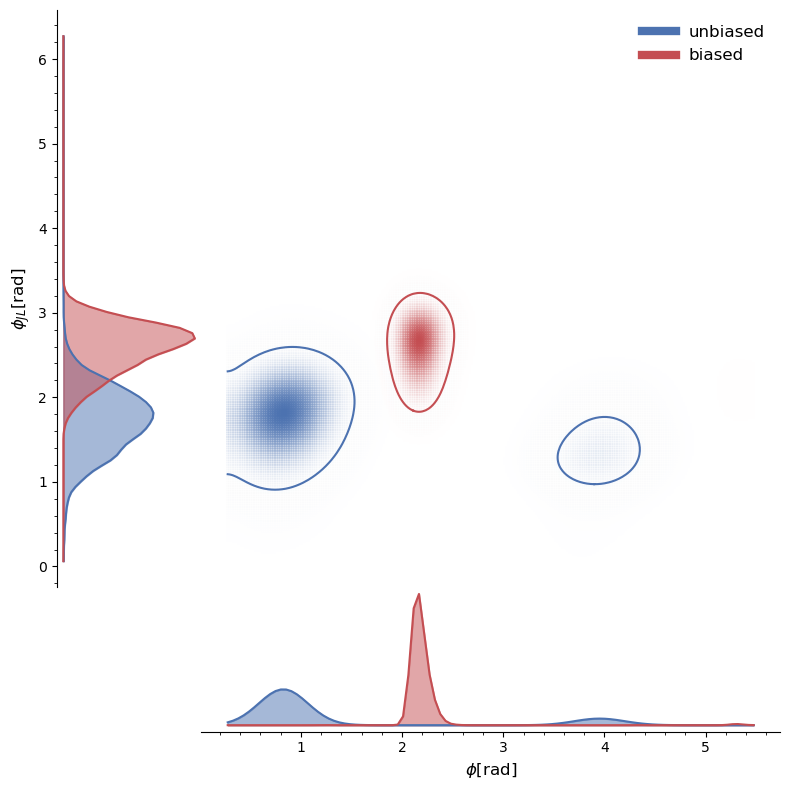

In [15]:
param_list = ['phase', 'phi_jl']

plot_2d(q_1, q_1_injection_values, ['mass_1'], param_list, 'q=1, n=500')
# plot_2d(q_1_n1000, q_1_n1000_injection_values, injection_labels, param_list, 'q=1, n=1000', save_path='./mass_ratio/2d_plot_total_mass_q_1_n1000.png')
# plot_2d(q_15, q_15_injection_values, injection_labels, param_list, 'q=1.5')
# plot_2d(q_2, q_2_injection_values, injection_labels, param_list, 'q=2', save_path='./mass_ratio/2d_plot_mass_q_2.png')
# plot_2d(q_25, q_25_injection_values, injection_labels, param_list, 'q=2.5')
# plot_2d(q_3, q_3_injection_values, injection_labels, param_list, 'q=3', save_path='./mass_ratio/2d_plot_mass_q_3.png')
# plot_2d(q_35, q_35_injection_values, injection_labels, param_list, 'q=3.5')
# plot_2d(q_4, q_4_injection_values, injection_labels, param_list, 'q=4')
# plot_2d(q_45, q_45_injection_values, injection_labels, param_list, 'q=4.5')
# plot_2d(q_5, q_5_injection_values, injection_labels, param_list, 'q=5', save_path='./mass_ratio/2d_plot_total_mass_q_5.png')

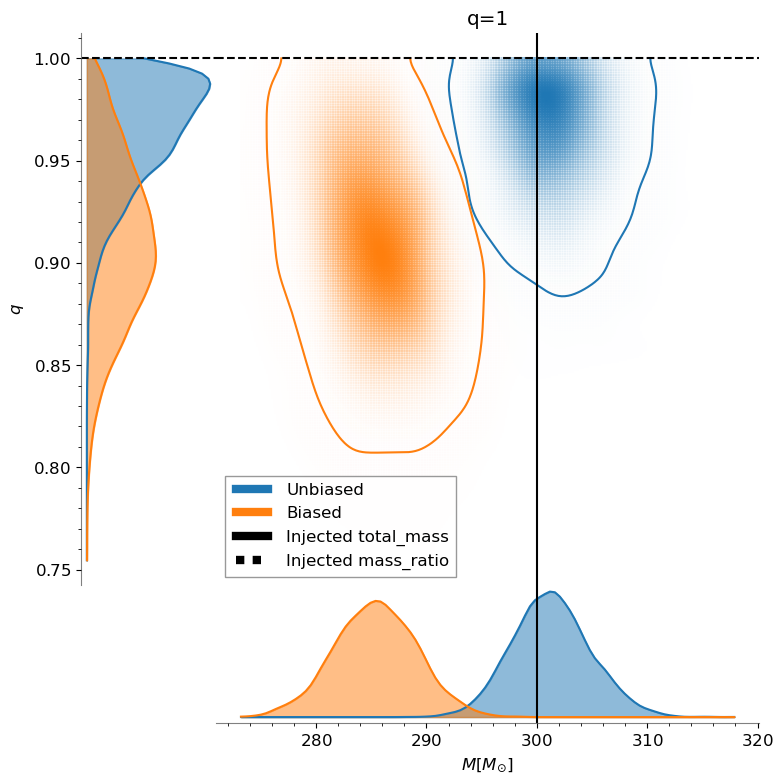

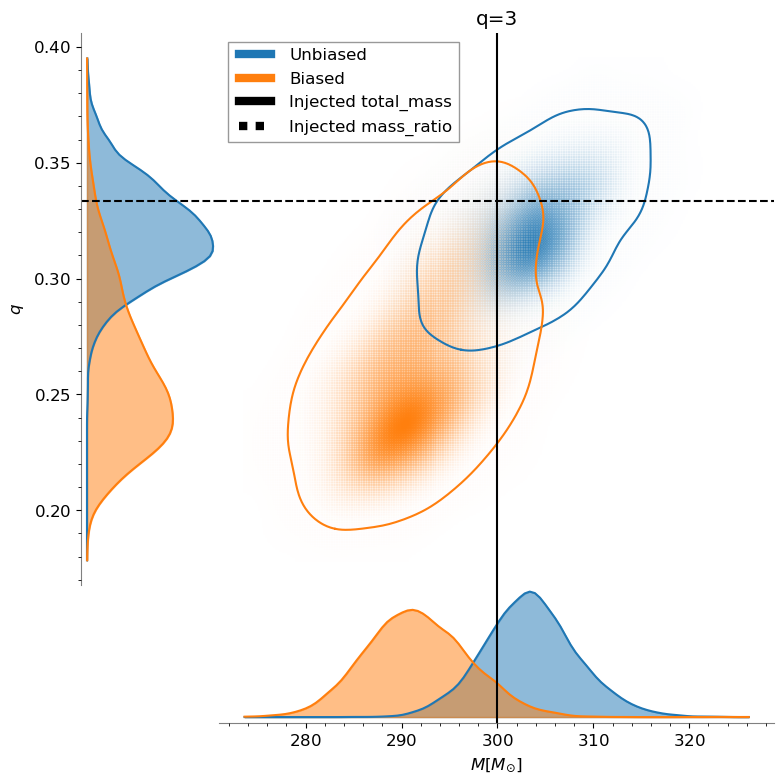

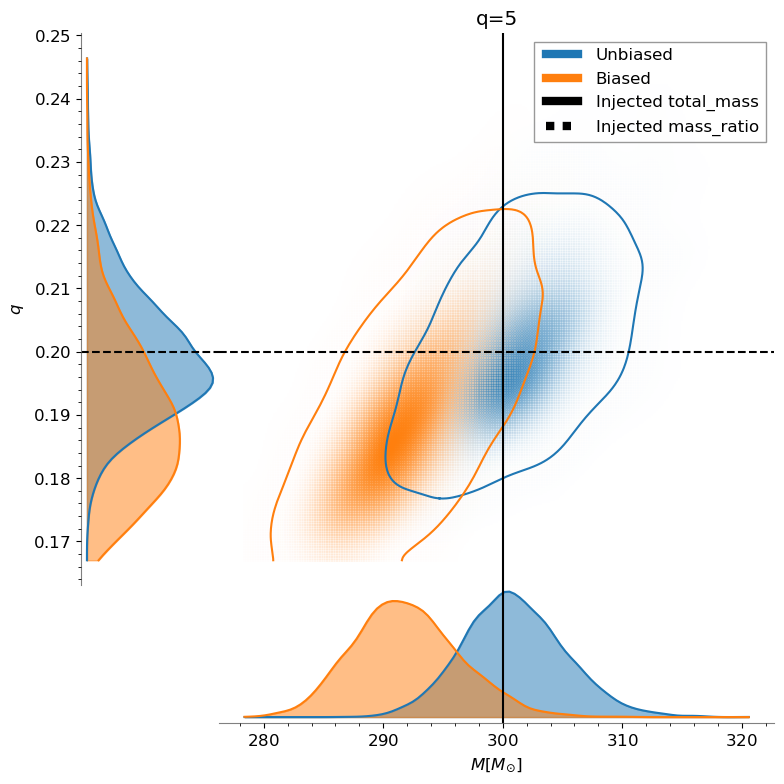

In [80]:
param_list = ['mass_1', 'mass_2']

plot_2d(q_1, q_1_injection_values, injection_labels, param_list, 'q=1')
plot_2d(q_1_n1000, q_1_n1000_injection_values, injection_labels, param_list, 'q=1')
plot_2d(q_15, q_15_injection_values, injection_labels, param_list, 'q=1.5')
plot_2d(q_2, q_2_injection_values, injection_labels, param_list, 'q=2')
plot_2d(q_25, q_25_injection_values, injection_labels, param_list, 'q=2.5')
plot_2d(q_3, q_3_injection_values, injection_labels, param_list, 'q=3')
plot_2d(q_35, q_35_injection_values, injection_labels, param_list, 'q=3.5')
plot_2d(q_4, q_4_injection_values, injection_labels, param_list, 'q=4')
plot_2d(q_45, q_45_injection_values, injection_labels, param_list, 'q=4.5')
plot_2d(q_5, q_5_injection_values, injection_labels, param_list, 'q=5')

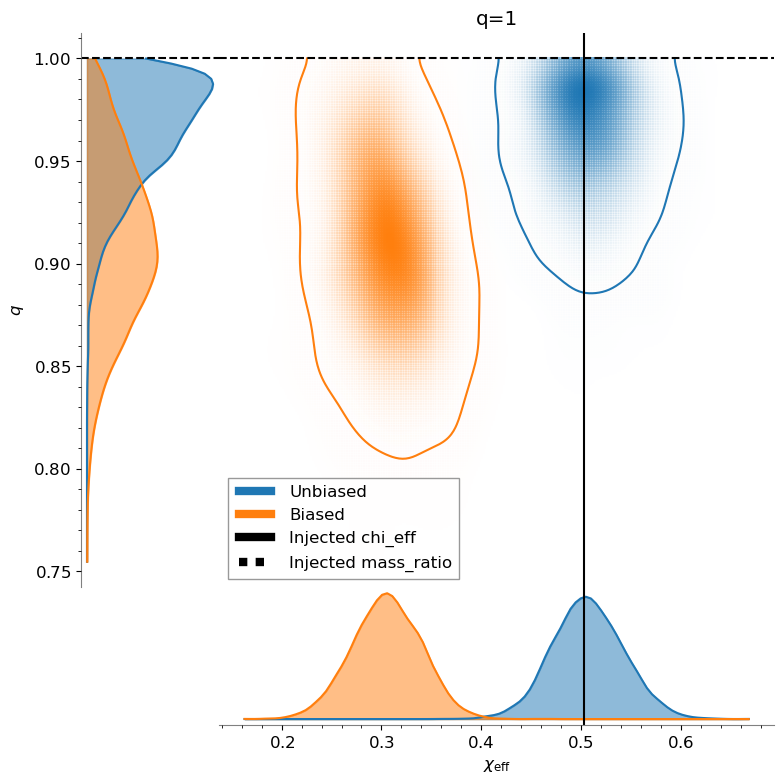

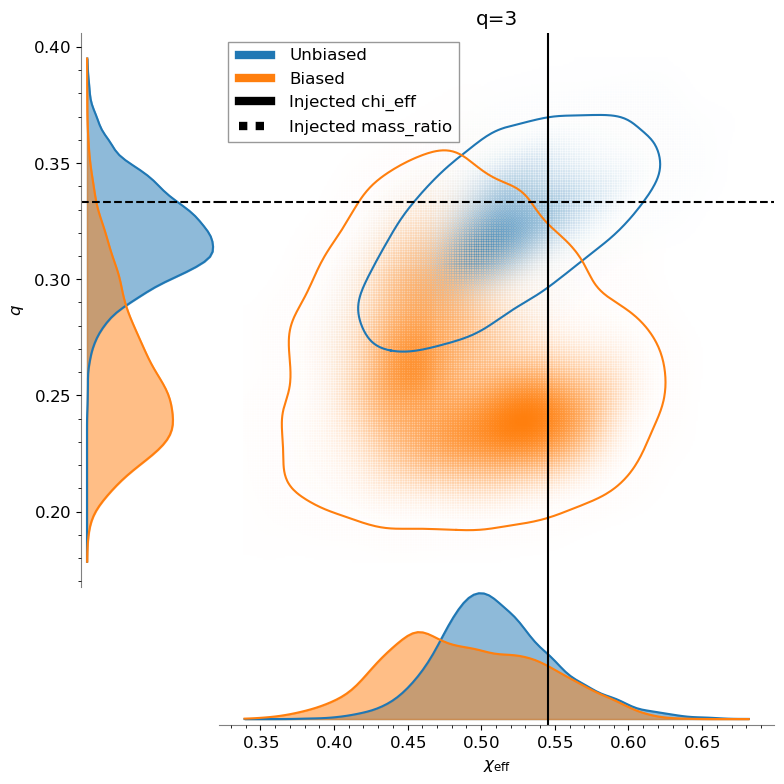

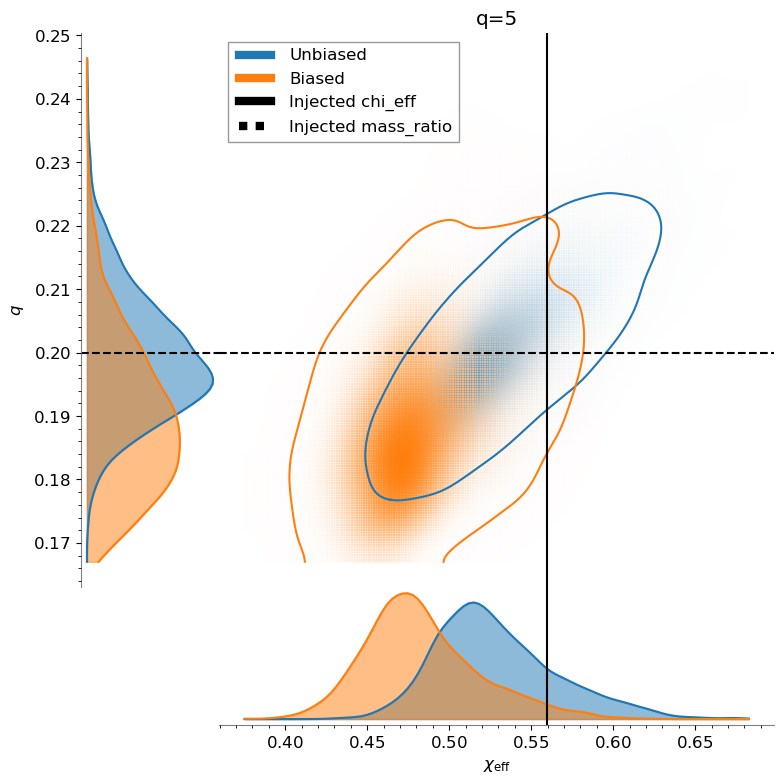

In [82]:
param_list = ['chi_eff', 'mass_ratio']

plot_2d(q_1, q_1_injection_values, injection_labels, param_list, 'q=1')
# plot_2d(q_1_n1000, q_1_n1000_injection_values, injection_labels, param_list, 'q=1')
# plot_2d(q_15, q_15_injection_values, injection_labels, param_list, 'q=1.5')
# plot_2d(q_2, q_2_injection_values, injection_labels, param_list, 'q=2')
# plot_2d(q_25, q_25_injection_values, injection_labels, param_list, 'q=2.5')
plot_2d(q_3, q_3_injection_values, injection_labels, param_list, 'q=3')
# plot_2d(q_35, q_35_injection_values, injection_labels, param_list, 'q=3.5')
# plot_2d(q_4, q_4_injection_values, injection_labels, param_list, 'q=4')
# plot_2d(q_45, q_45_injection_values, injection_labels, param_list, 'q=4.5')
plot_2d(q_5, q_5_injection_values, injection_labels, param_list, 'q=5')

In [13]:
param_list = ['a_1', 'a_2']

# plot_2d(q_1, q_1_injection_values, injection_labels, param_list, 'q=1')
# plot_2d(q_1_n1000, q_1_n1000_injection_values, injection_labels, param_list, 'q=1')
# plot_2d(q_15, q_15_injection_values, injection_labels, param_list, 'q=1.5')
# plot_2d(q_2, q_2_injection_values, injection_labels, param_list, 'q=2')
# plot_2d(q_25, q_25_injection_values, injection_labels, param_list, 'q=2.5')
plot_2d(q_3, q_3_injection_values, injection_labels, param_list, 'q=3', save_path='./mass_ratio/2d_plot_spin_q_3.png')
# plot_2d(q_35, q_35_injection_values, injection_labels, param_list, 'q=3.5')
# plot_2d(q_4, q_4_injection_values, injection_labels, param_list, 'q=4')
# plot_2d(q_45, q_45_injection_values, injection_labels, param_list, 'q=4.5')
# plot_2d(q_5, q_5_injection_values, injection_labels, param_list, 'q=5')

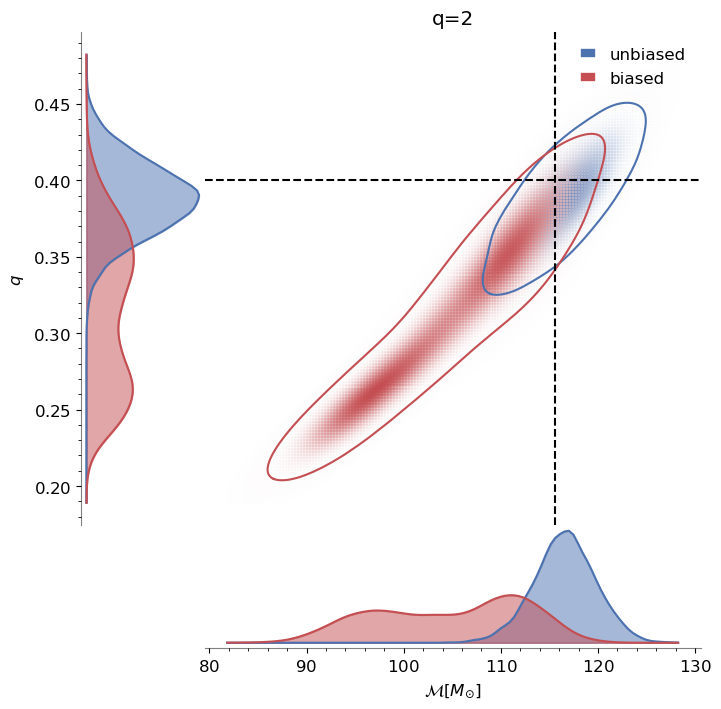

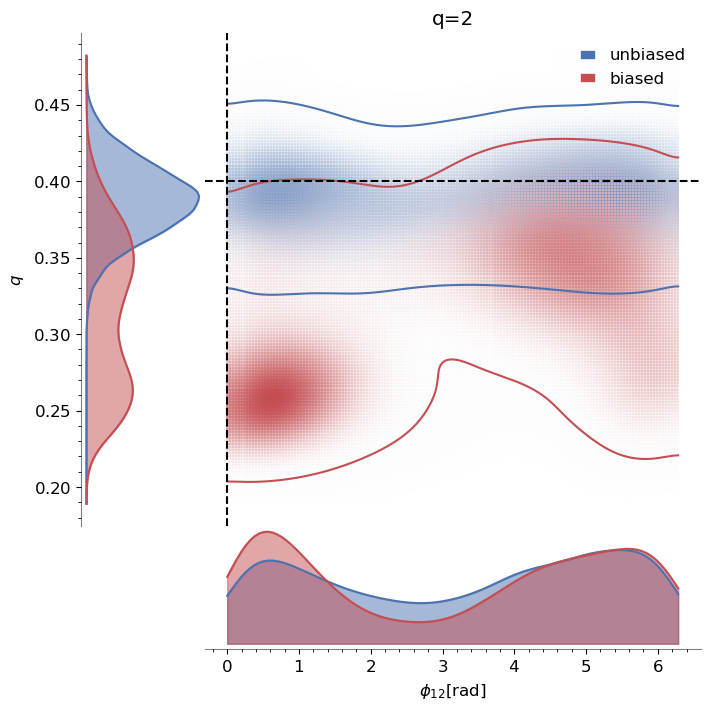

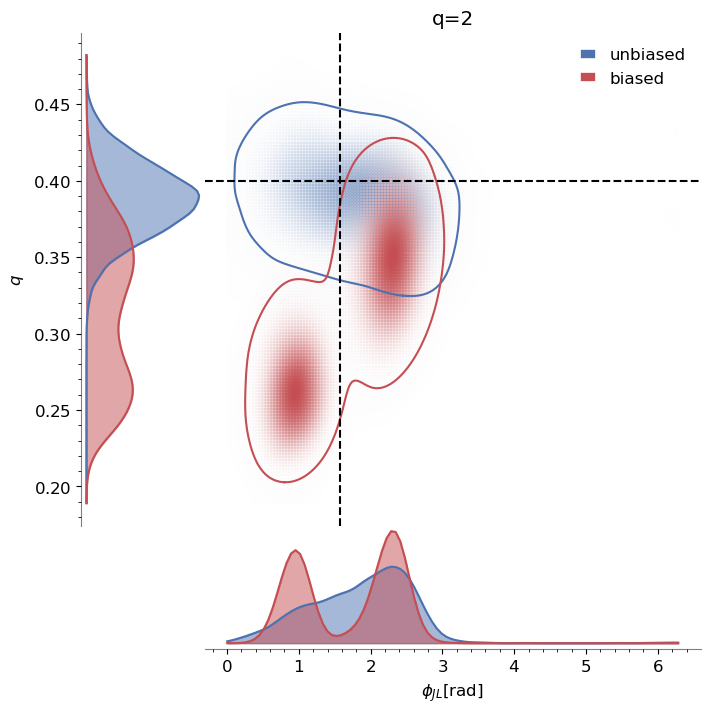

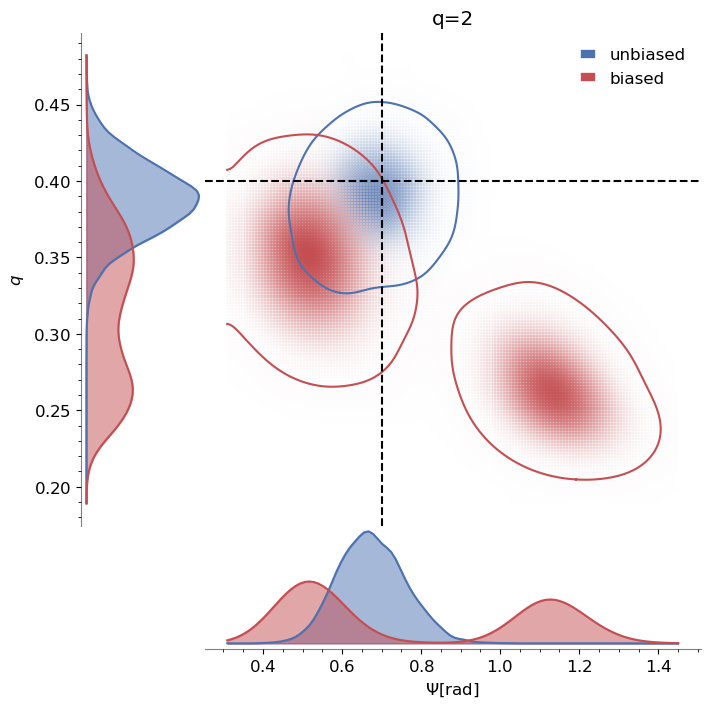

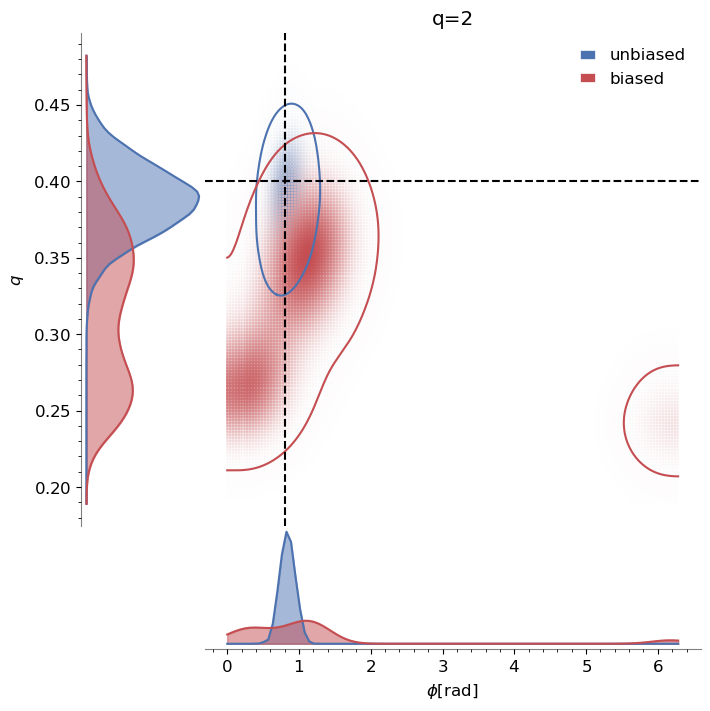

...

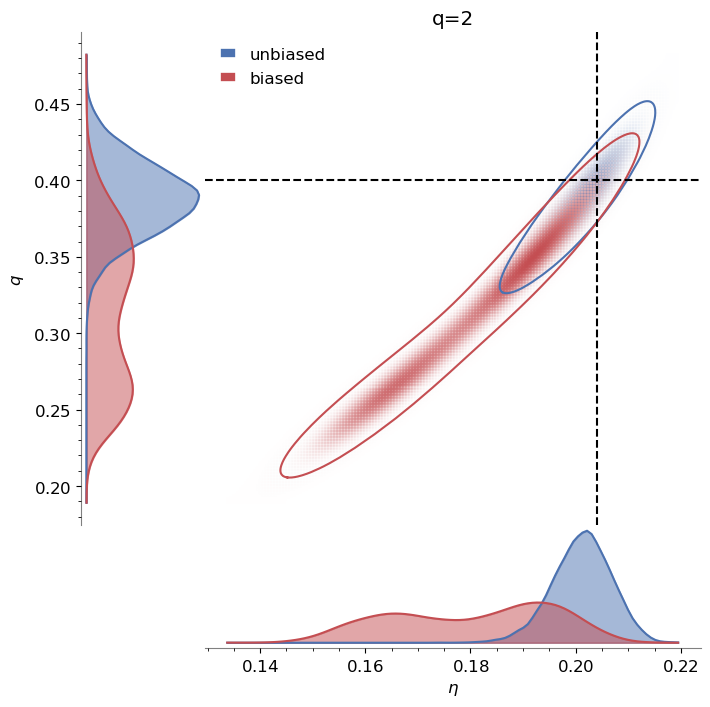

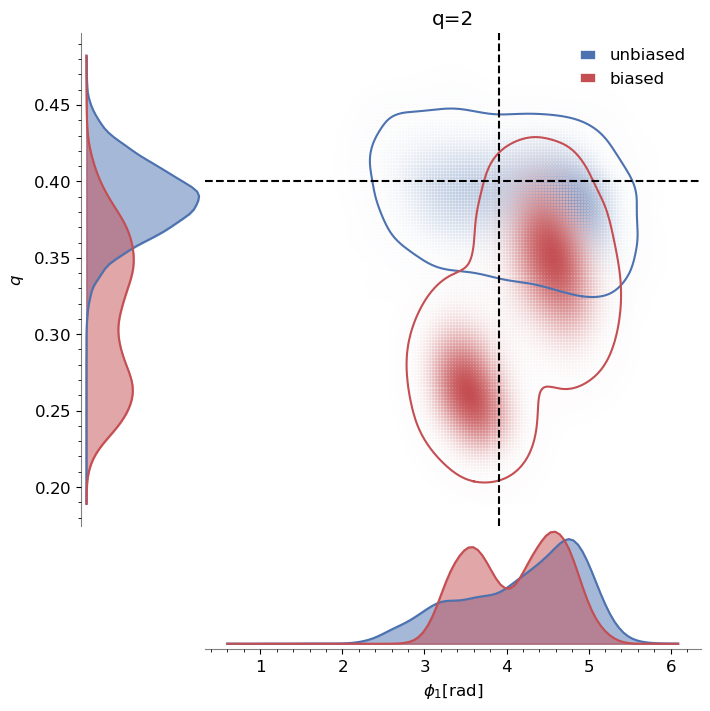

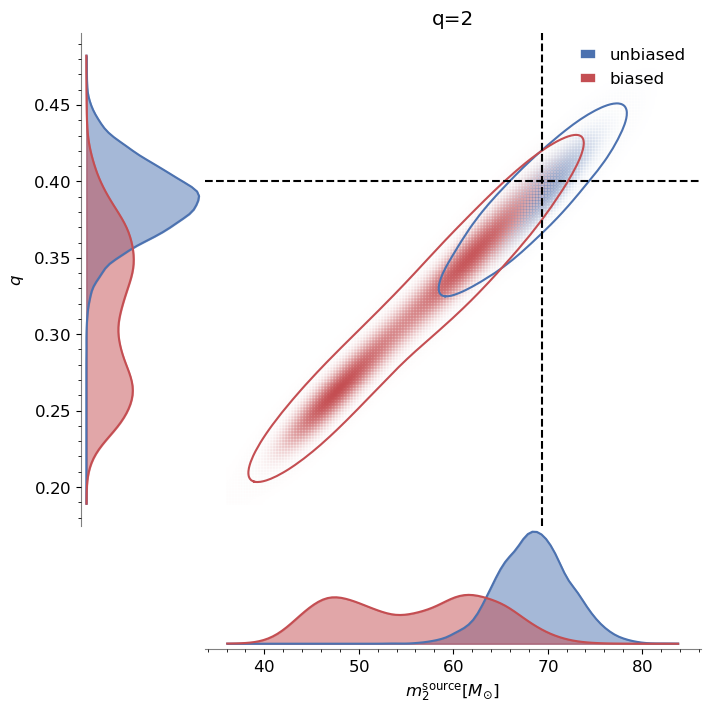

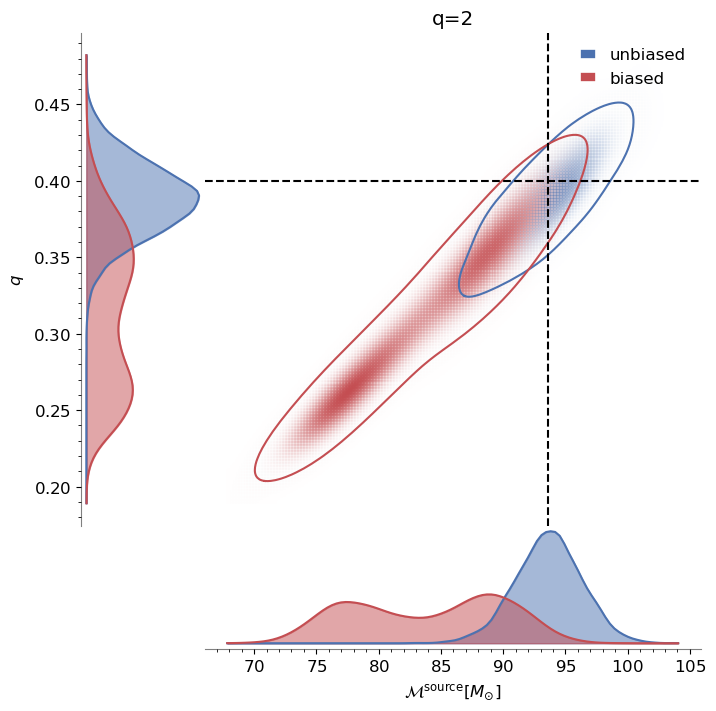

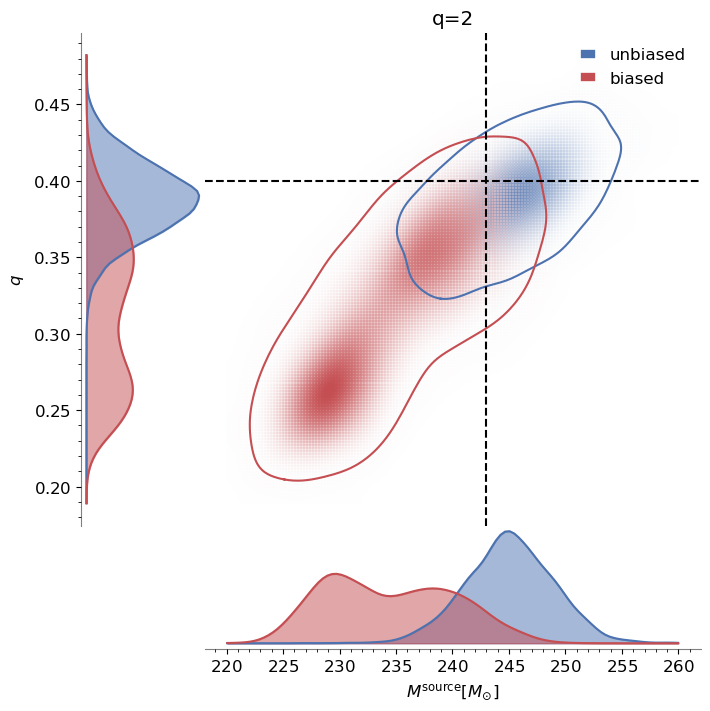

In [68]:
param_list = ['chirp_mass', 'phi_12', 'phi_jl', 'psi', 'phase', 'total_mass', 'symmetric_mass_ratio', 'phi_1', 'mass_2_source', 'chirp_mass_source', 'total_mass_source']
for param in param_list:
    plot_2d(q_2, q_2_injection_values, injection_labels, [param, 'mass_ratio'], 'q=2')

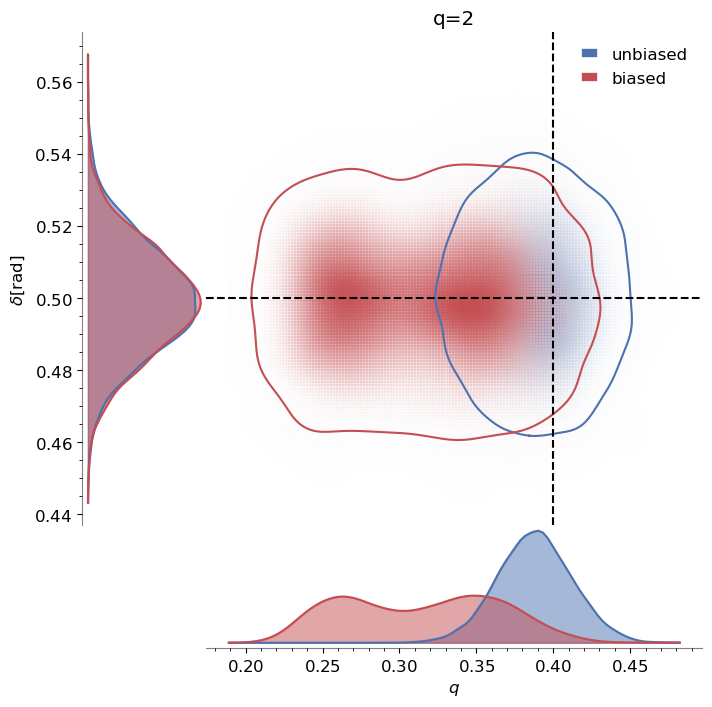

In [72]:
param_list = ['mass_ratio', 'dec']
plot_2d(q_2, q_2_injection_values, injection_labels, param_list, 'q=2')

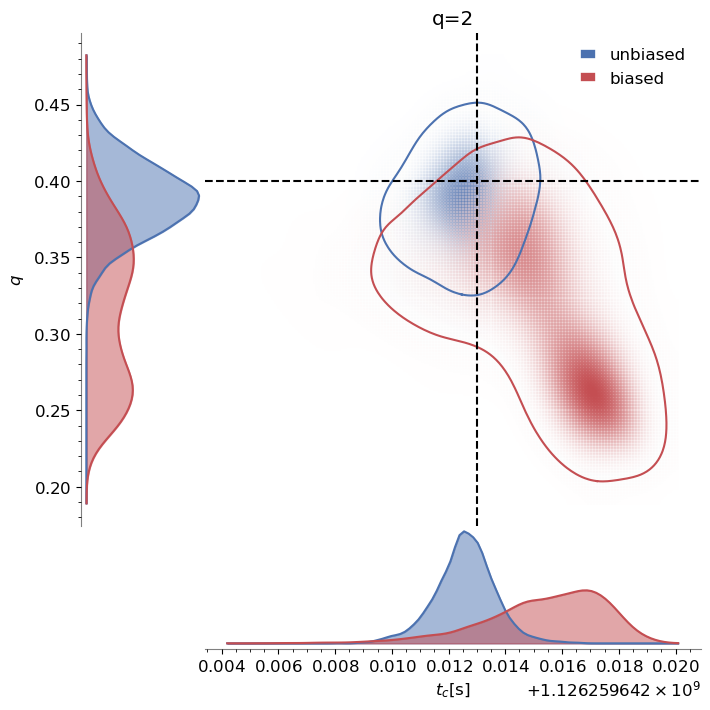

In [74]:
param_list = ['geocent_time', 'mass_ratio']
plot_2d(q_2, q_2_injection_values, injection_labels, param_list, 'q=2')

### Total Mass

#### Varying Total Mass

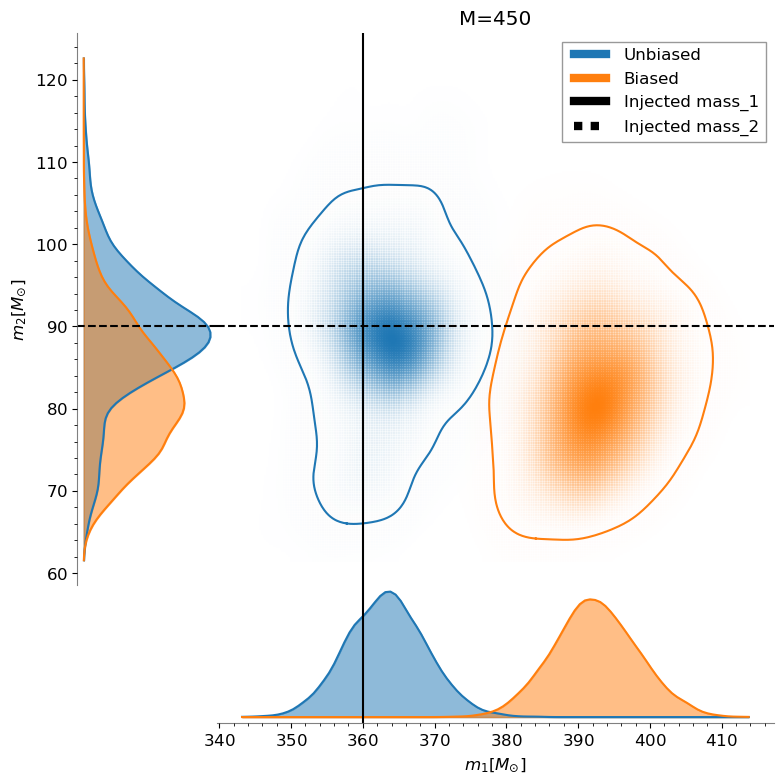

In [74]:
param_list = ['mass_1', 'mass_2']
path_name = './total_mass/2d_plot_mass_M_450.pdf'

# plot_2d(M_200, M_200_injection_values, injection_labels, param_list, 'M=200')
# plot_2d(M_250, M_250_injection_values, injection_labels, param_list, 'M=250')
# plot_2d(M_300, M_300_injection_values, injection_labels, param_list, 'M=300')
# plot_2d(M_350, M_350_injection_values, injection_labels, param_list, 'M=350')
# plot_2d(M_400, M_400_injection_values, injection_labels, param_list, 'M=400')
plot_2d(M_450, M_450_injection_values, injection_labels, param_list, 'M=450', save_path=path_name)

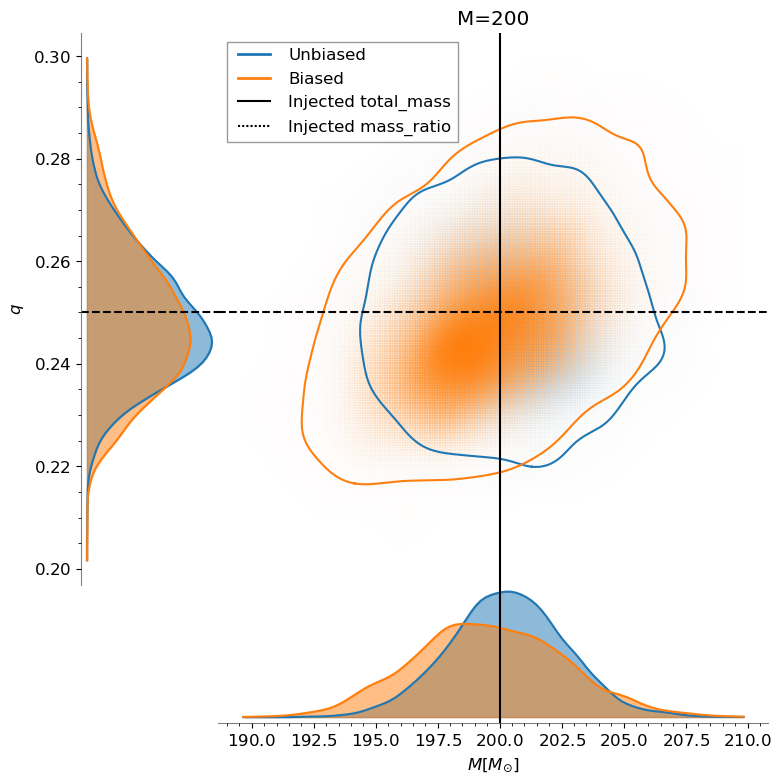

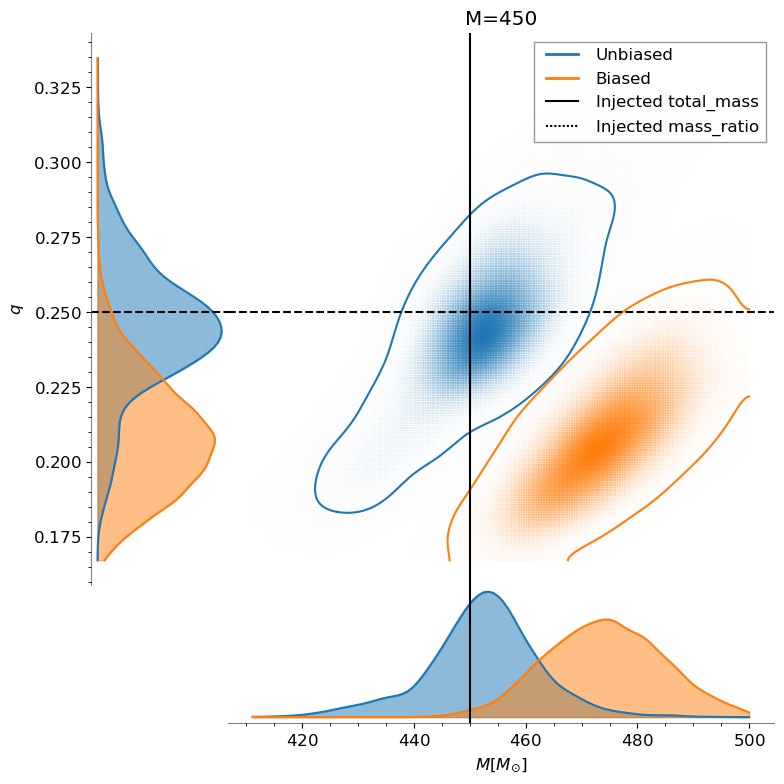

In [35]:
param_list = ['total_mass', 'mass_ratio']

plot_2d(M_200, M_200_injection_values, injection_labels, param_list, 'M=200', save_path='./total_mass/2d_plot_total_mass_200.png')
# plot_2d(M_250, M_250_injection_values, injection_labels, param_list, 'M=250')
# plot_2d(M_300, M_300_injection_values, injection_labels, param_list, 'M=300')
# plot_2d(M_350, M_350_injection_values, injection_labels, param_list, 'M=350')
# plot_2d(M_400, M_400_injection_values, injection_labels, param_list, 'M=400')
plot_2d(M_450, M_450_injection_values, injection_labels, param_list, 'M=450', save_path='./total_mass/2d_plot_total_mass_450.png')

In [ ]:
param_list = ['chi_eff', 'mass_ratio']

# plot_2d(M_200, M_200_injection_values, injection_labels, param_list, 'M=200')
# plot_2d(M_250, M_250_injection_values, injection_labels, param_list, 'M=250')
# plot_2d(M_300, M_300_injection_values, injection_labels, param_list, 'M=300')
# plot_2d(M_350, M_350_injection_values, injection_labels, param_list, 'M=350')
plot_2d(M_400, M_400_injection_values, injection_labels, param_list, 'M=400', save_path='./plots/2d_plot_total_mass_400.png')
# plot_2d(M_450, M_450_injection_values, injection_labels, param_list, 'M=450')

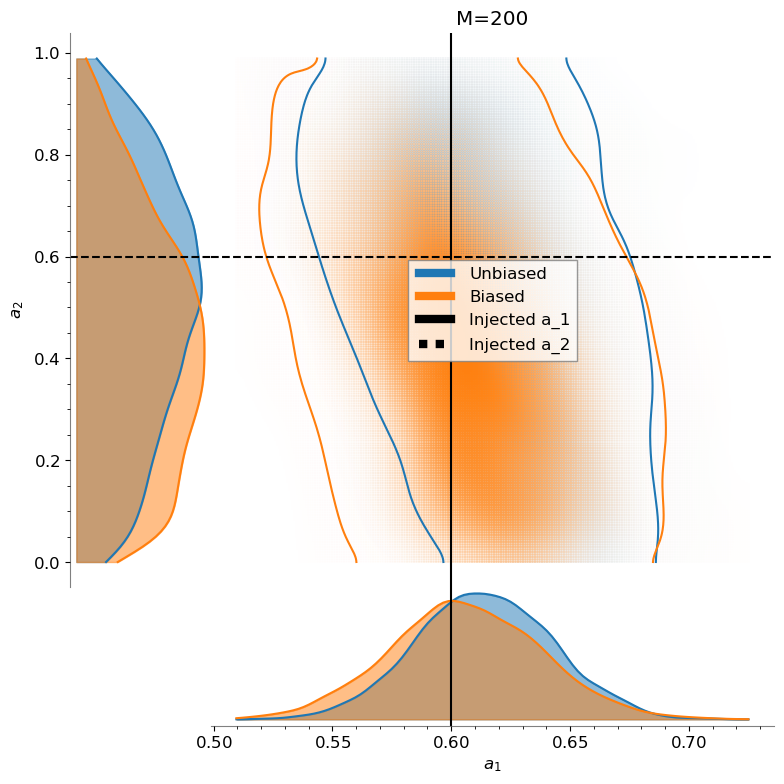

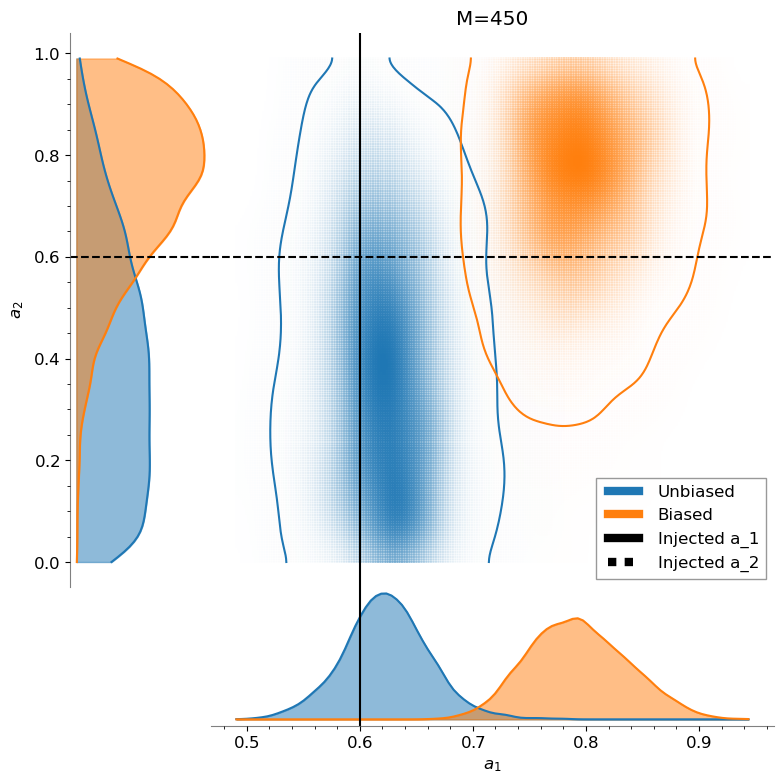

In [53]:
param_list = ['a_1', 'a_2']

plot_2d(M_200, M_200_injection_values, injection_labels, param_list, 'M=200', save_path='./total_mass/2d_plot_spin_200.png')
# plot_2d(M_250, M_250_injection_values, injection_labels, param_list, 'M=250')
# plot_2d(M_300, M_300_injection_values, injection_labels, param_list, 'M=300')
# plot_2d(M_350, M_350_injection_values, injection_labels, param_list, 'M=350')
# plot_2d(M_400, M_400_injection_values, injection_labels, param_list, 'M=400')
plot_2d(M_450, M_450_injection_values, injection_labels, param_list, 'M=450', save_path='./total_mass/2d_plot_spin_450.png')

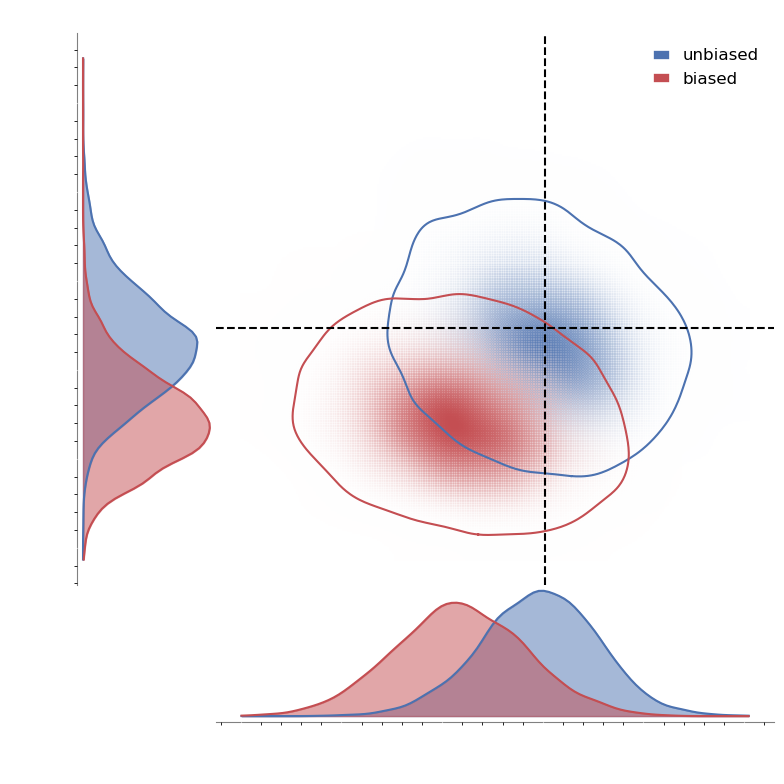

In [41]:
param_list = ['luminosity_distance', 'theta_jn']
path_name = './total_mass/2d_plot_inclination.pdf'

# plot_2d(M_200, M_200_injection_values, injection_labels, param_list, 'M=200')
# plot_2d(M_250, M_250_injection_values, injection_labels, param_list, 'M=250')
plot_2d(M_300, M_300_injection_values, injection_labels, param_list, 'M=300', save_path=path_name)
# plot_2d(M_350, M_350_injection_values, injection_labels, param_list, 'M=350')
# plot_2d(M_400, M_400_injection_values, injection_labels, param_list, 'M=400')
# plot_2d(M_450, M_450_injection_values, injection_labels, param_list, 'M=450')

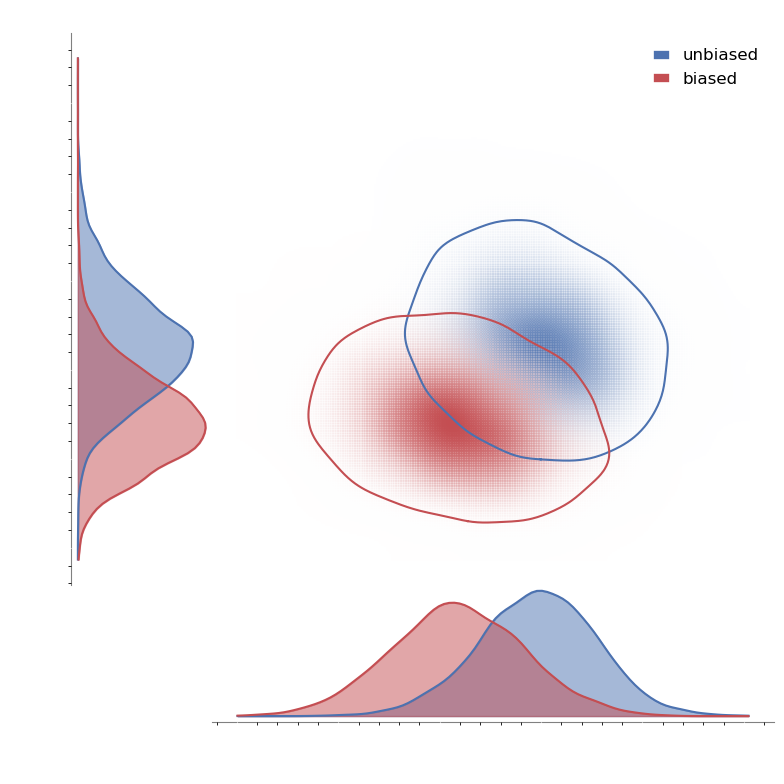

In [42]:
param_list = ['luminosity_distance', 'viewing_angle']
path_name = './total_mass/2d_plot_viewing.pdf'

# plot_2d(M_200, M_200_injection_values, injection_labels, param_list, 'M=200')
# plot_2d(M_250, M_250_injection_values, injection_labels, param_list, 'M=250')
plot_2d(M_300, M_300_injection_values, injection_labels, param_list, 'M=300', save_path=path_name)
# plot_2d(M_350, M_350_injection_values, injection_labels, param_list, 'M=350')
# plot_2d(M_400, M_400_injection_values, injection_labels, param_list, 'M=400')
# plot_2d(M_450, M_450_injection_values, injection_labels, param_list, 'M=450')

#### Changing Starting Frequency for M=350

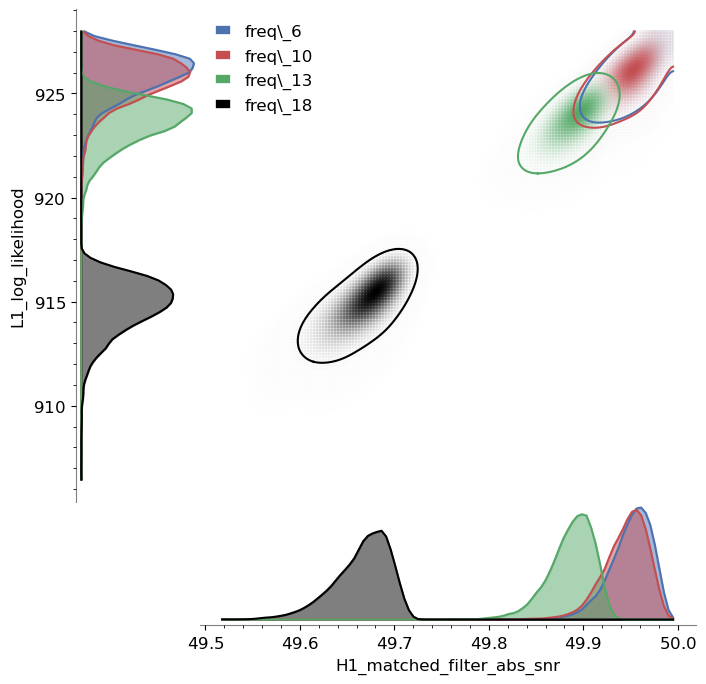

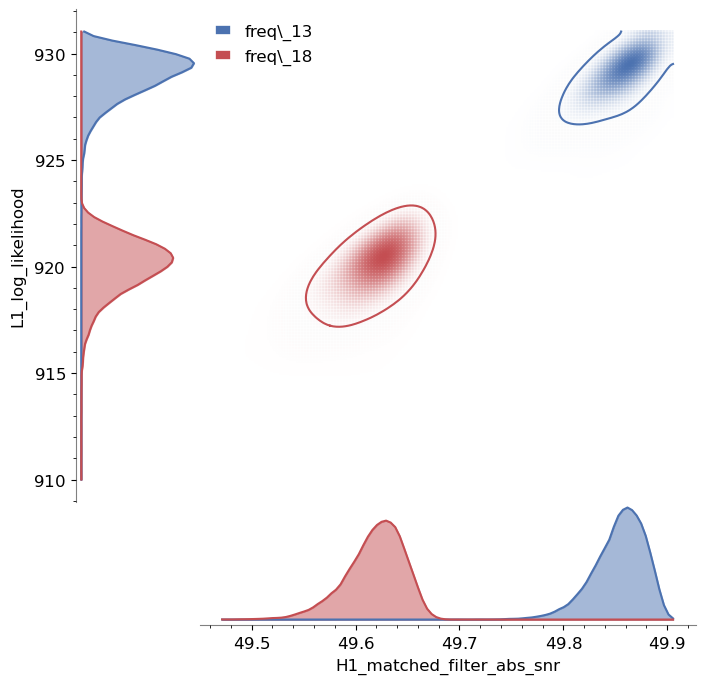

In [67]:
param_list = ['H1_matched_filter_abs_snr', 'L1_log_likelihood']

plot_2d(M_350_freq_start, M_350_freq_start_injection_values, injection_labels, param_list, 'M=350')
plot_2d(M_400_freq_start, M_400_freq_start_injection_values, injection_labels, param_list, 'M=400')

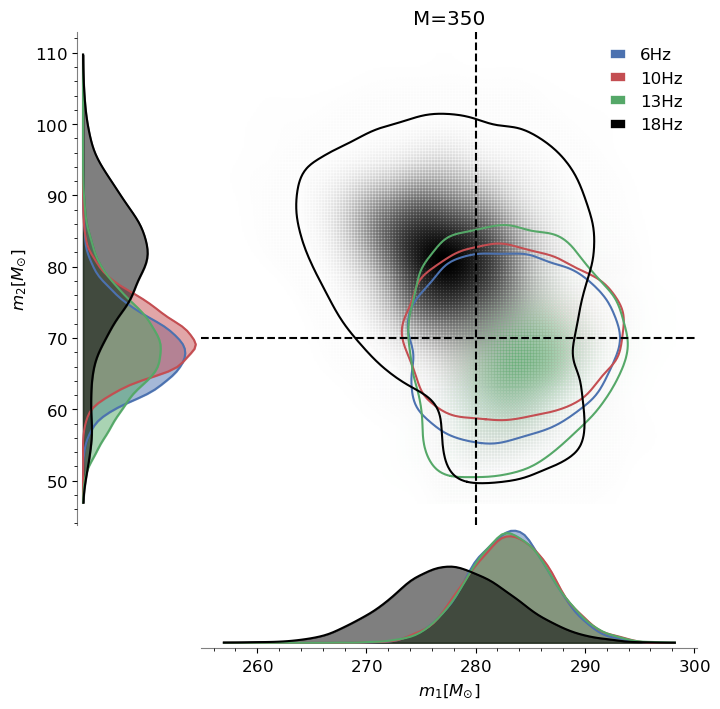

In [30]:
param_list = ['mass_1', 'mass_2']

plot_2d(M_350_freq_start, M_350_freq_start_injection_values, injection_labels, param_list, 'M=350')

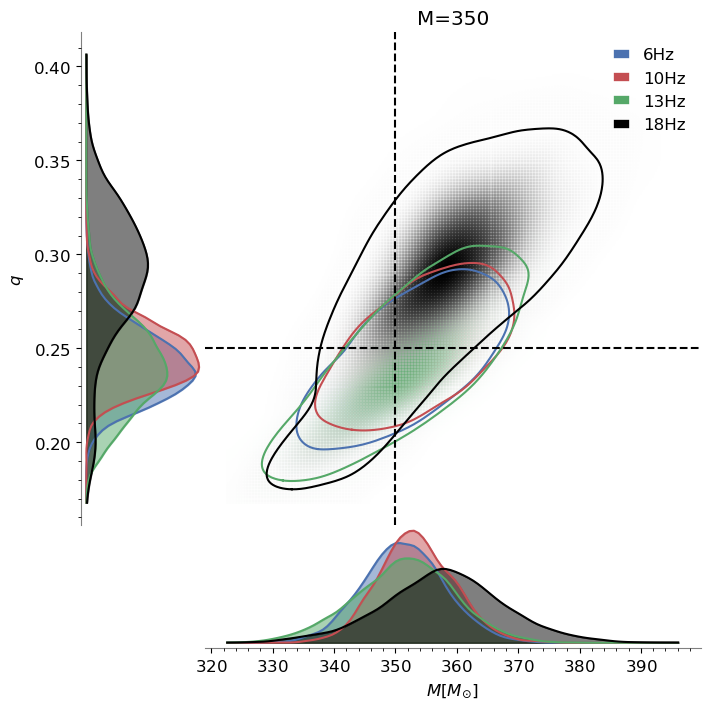

In [31]:
param_list = ['total_mass', 'mass_ratio']

plot_2d(M_350_freq_start, M_350_freq_start_injection_values, injection_labels, param_list, 'M=350')

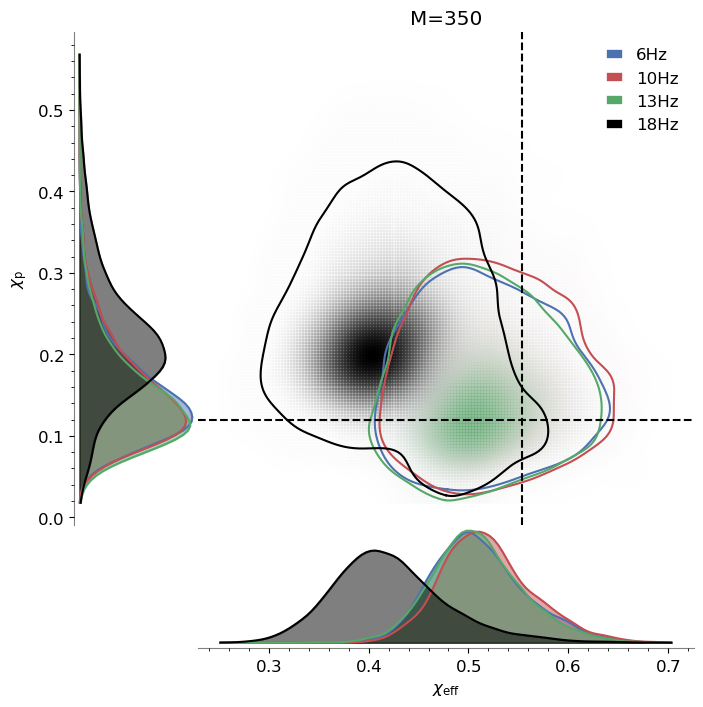

In [32]:
param_list = ['chi_eff', 'chi_p']

plot_2d(M_350_freq_start, M_350_freq_start_injection_values, injection_labels, param_list, 'M=350')

### SNR

In [ ]:
param_list = ['chi_eff', 'mass_ratio']

plot_2d(SNR_30, SNR_30_injection_values, injection_labels, param_list, 'SNR=30')
plot_2d(SNR_35, SNR_35_injection_values, injection_labels, param_list, 'SNR=35')
plot_2d(SNR_40, SNR_40_injection_values, injection_labels, param_list, 'SNR=40')
plot_2d(SNR_45, SNR_45_injection_values, injection_labels, param_list, 'SNR=45')
plot_2d(SNR_50, SNR_50_injection_values, injection_labels, param_list, 'SNR=50')
plot_2d(SNR_55, SNR_55_injection_values, injection_labels, param_list, 'SNR=55')
plot_2d(SNR_60, SNR_60_injection_values, injection_labels, param_list, 'SNR=60')

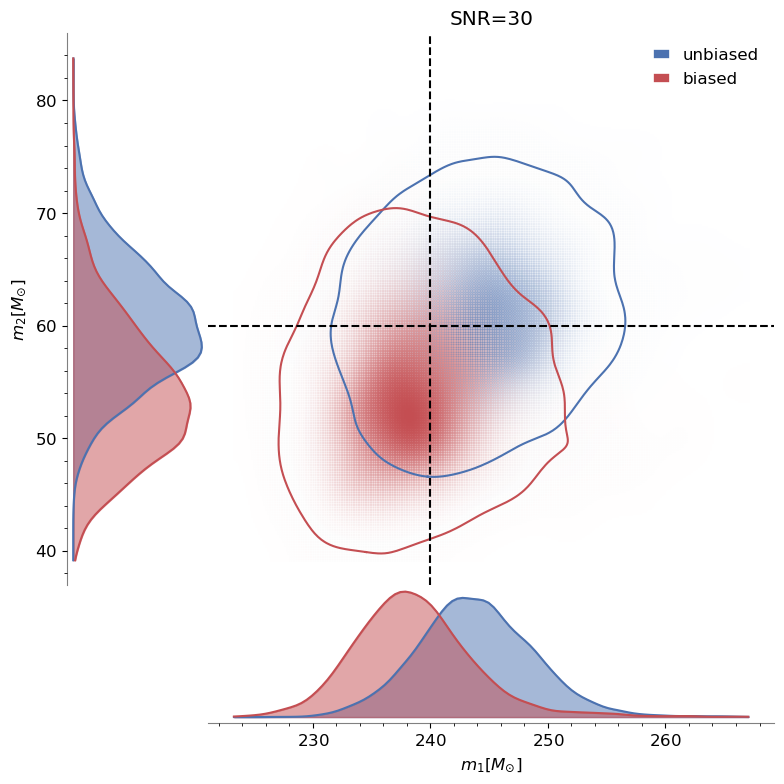

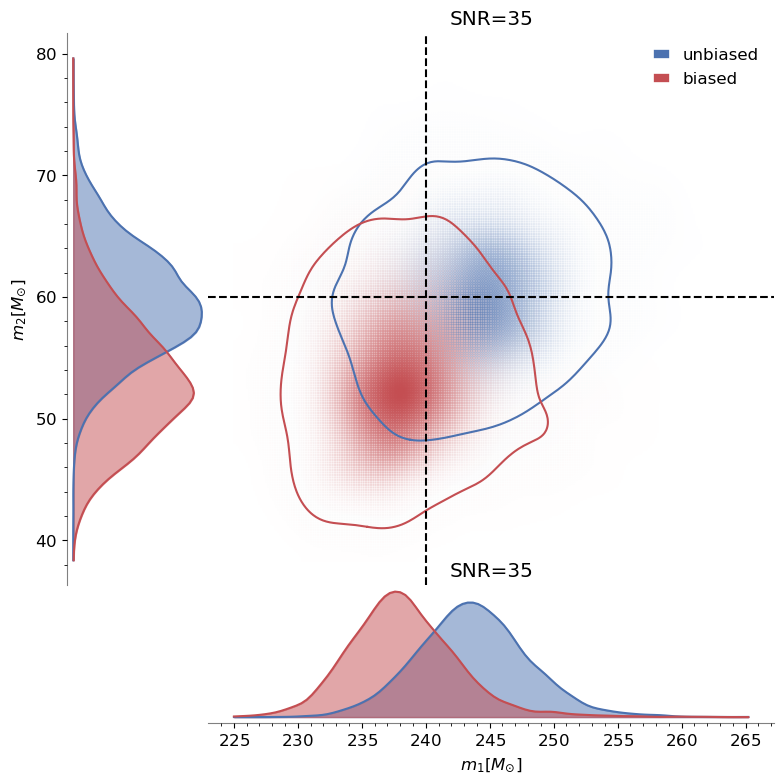

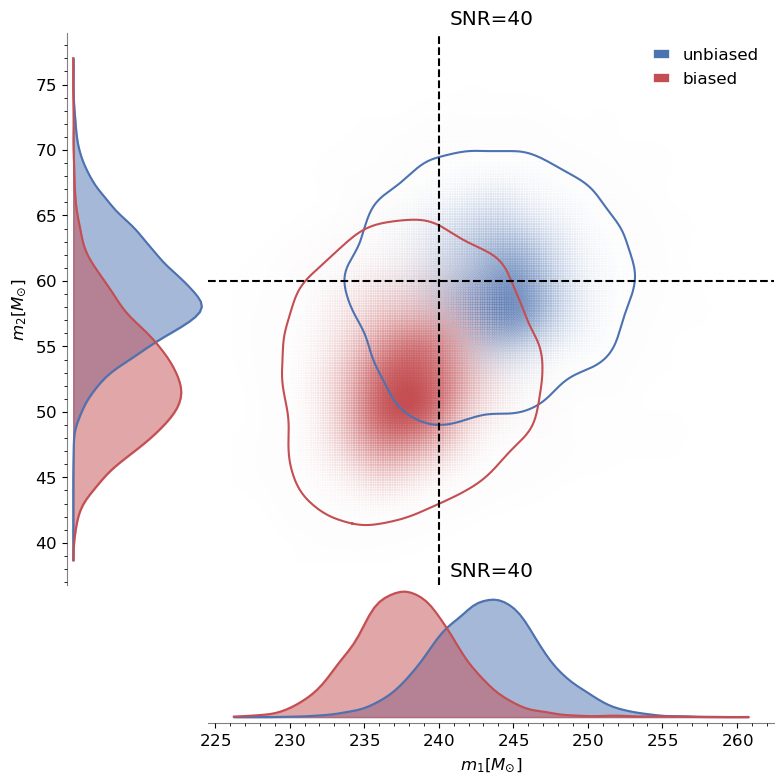

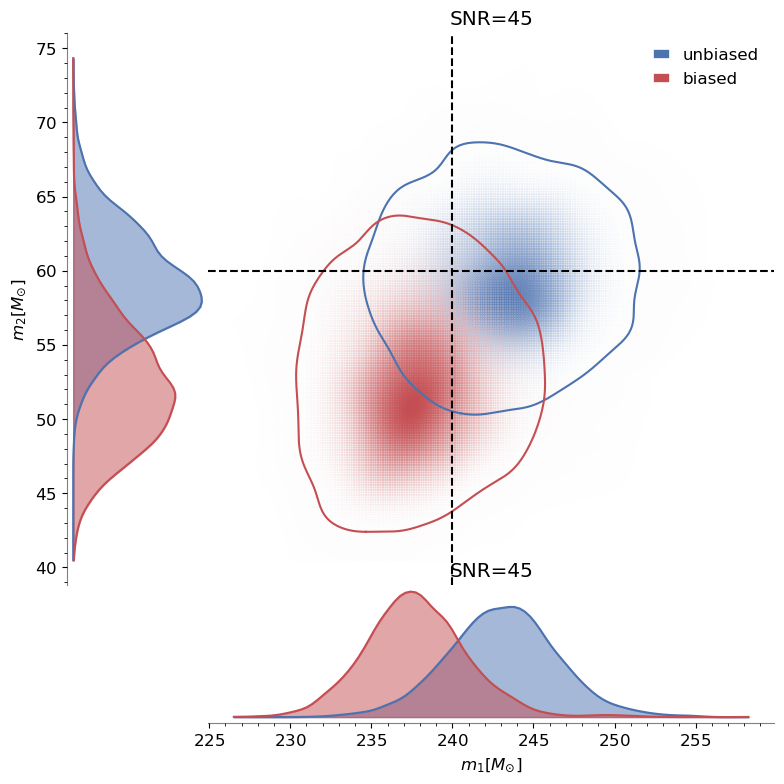

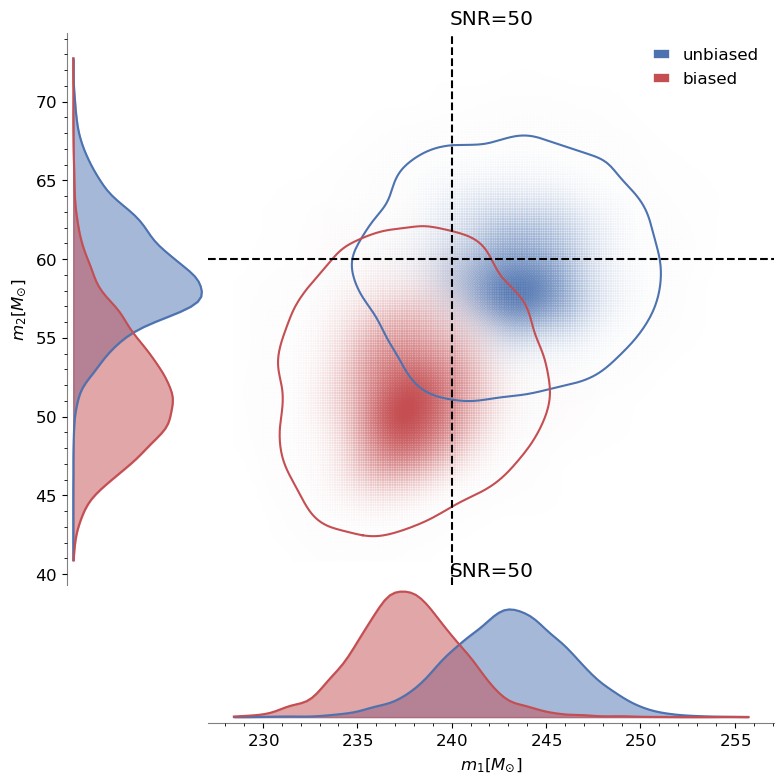

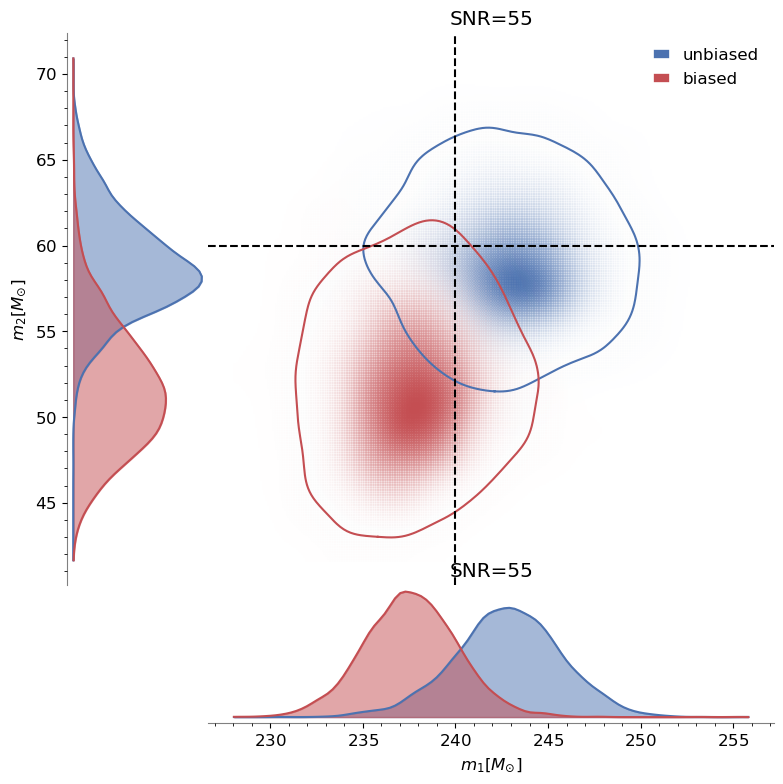

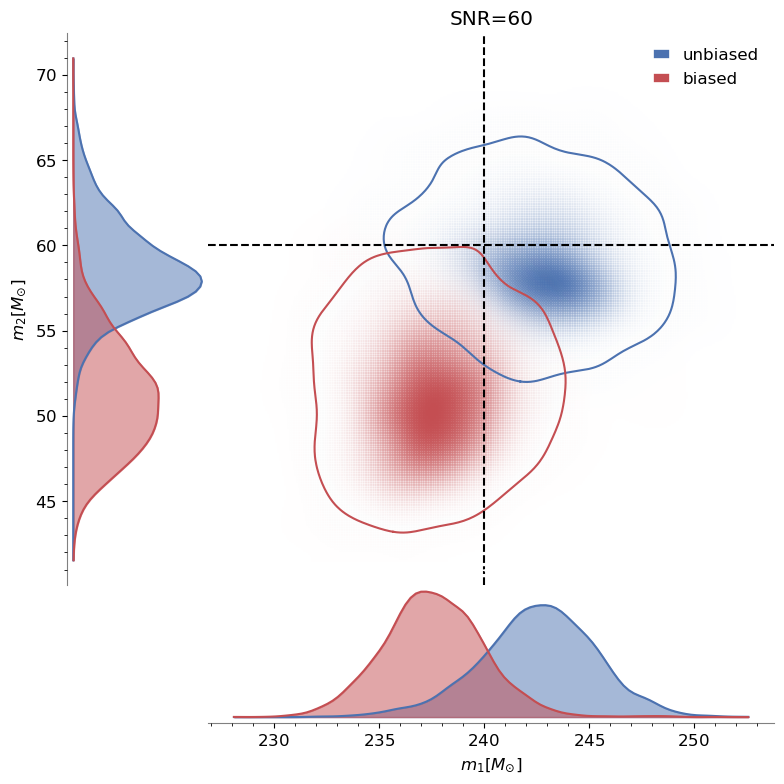

In [20]:
param_list = ['mass_1', 'mass_2']

plot_2d(SNR_30, SNR_30_injection_values, injection_labels, param_list, 'SNR=30', save_path='./SNR/2d_plot_mass_SNR_30.pdf')
plot_2d(SNR_35, SNR_35_injection_values, injection_labels, param_list, 'SNR=35')
plot_2d(SNR_40, SNR_40_injection_values, injection_labels, param_list, 'SNR=40')
plot_2d(SNR_45, SNR_45_injection_values, injection_labels, param_list, 'SNR=45')
plot_2d(SNR_50, SNR_50_injection_values, injection_labels, param_list, 'SNR=50')
plot_2d(SNR_55, SNR_55_injection_values, injection_labels, param_list, 'SNR=55')
plot_2d(SNR_60, SNR_60_injection_values, injection_labels, param_list, 'SNR=60', save_path='./SNR/2d_plot_mass_SNR_60.pdf')

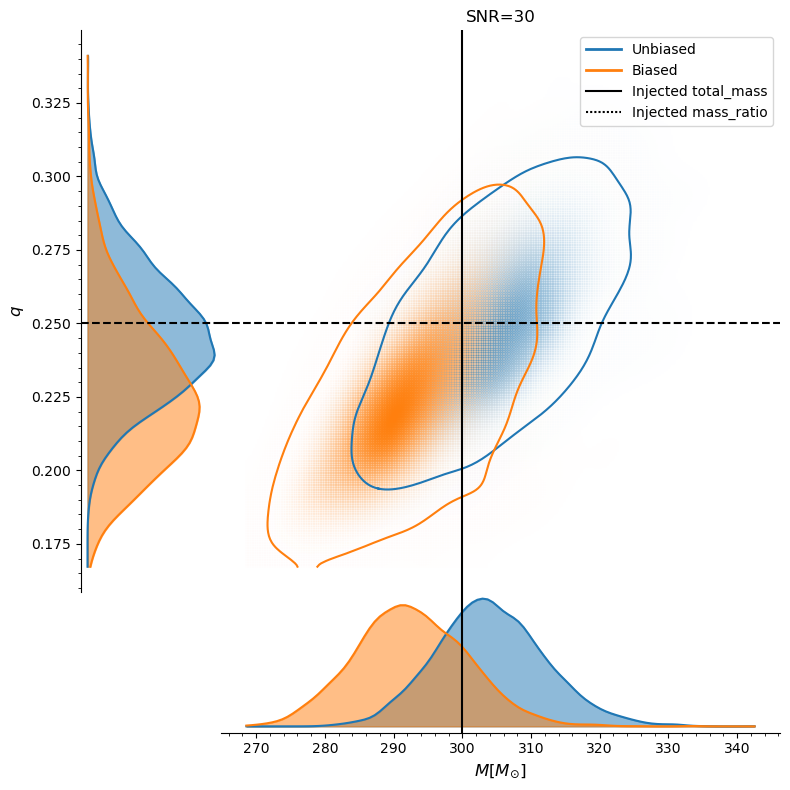

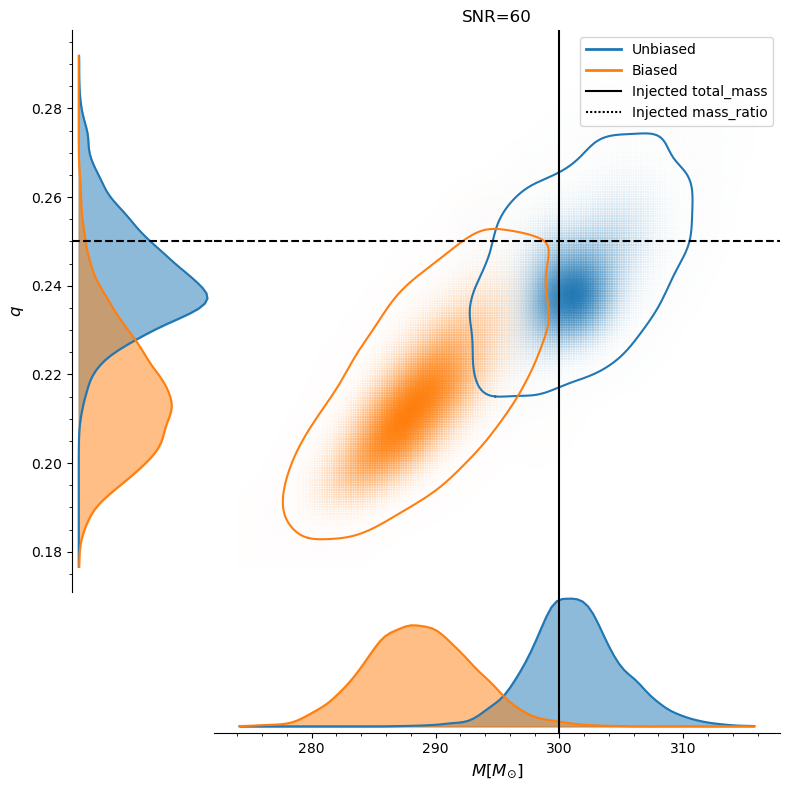

In [33]:
param_list = ['total_mass', 'mass_ratio']

plot_2d(SNR_30, SNR_30_injection_values, injection_labels, param_list, 'SNR=30', save_path='./SNR/2d_plot_total_mass_SNR_30.png')
# plot_2d(SNR_35, SNR_35_injection_values, injection_labels, param_list, 'SNR=35')
# plot_2d(SNR_40, SNR_40_injection_values, injection_labels, param_list, 'SNR=40')
# plot_2d(SNR_45, SNR_45_injection_values, injection_labels, param_list, 'SNR=45')
# plot_2d(SNR_50, SNR_50_injection_values, injection_labels, param_list, 'SNR=50')
# plot_2d(SNR_55, SNR_55_injection_values, injection_labels, param_list, 'SNR=55')
plot_2d(SNR_60, SNR_60_injection_values, injection_labels, param_list, 'SNR=60', save_path='./SNR/2d_plot_total_mass_SNR_60.png')

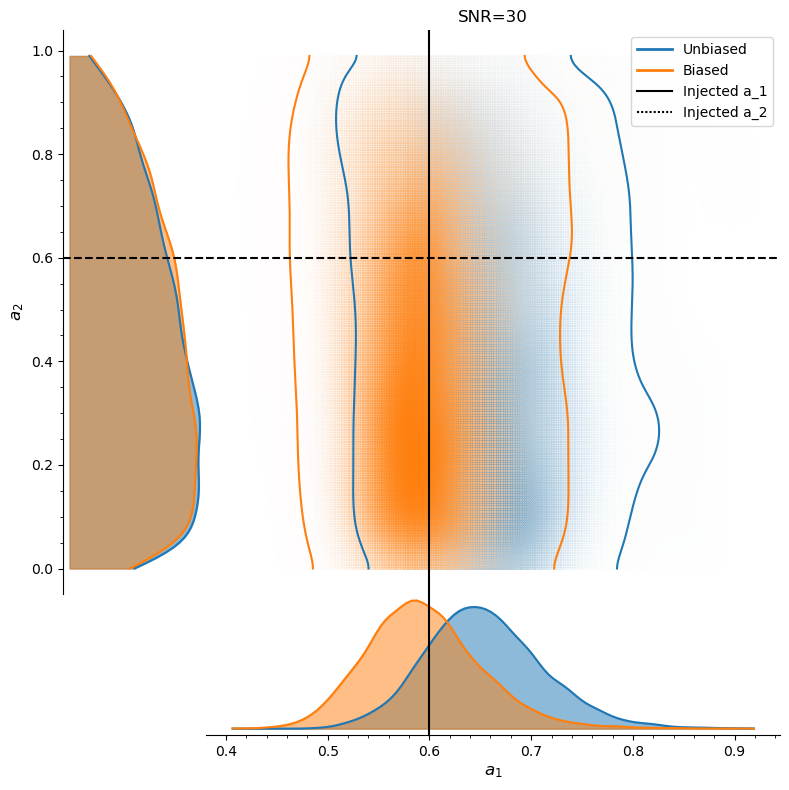

In [14]:
param_list = ['a_1', 'a_2']

plot_2d(SNR_30, SNR_30_injection_values, injection_labels, param_list, 'SNR=30', save_path='./plots/2d_plot_spin_SNR_30.png')
# plot_2d(SNR_35, SNR_35_injection_values, injection_labels, param_list, 'SNR=35')
# plot_2d(SNR_40, SNR_40_injection_values, injection_labels, param_list, 'SNR=40')
# plot_2d(SNR_45, SNR_45_injection_values, injection_labels, param_list, 'SNR=45')
# plot_2d(SNR_50, SNR_50_injection_values, injection_labels, param_list, 'SNR=50')
# plot_2d(SNR_55, SNR_55_injection_values, injection_labels, param_list, 'SNR=55')
# plot_2d(SNR_60, SNR_60_injection_values, injection_labels, param_list, 'SNR=60', save_path='./plots/2d_plot_spin_SNR_60.pdf')

# PSD

['AdVBNSOptimizedSensitivityP1200087', 'AdVDesignSensitivityP1200087', 'AdVEarlyHighSensitivityP1200087', 'AdVEarlyLowSensitivityP1200087', 'AdVLateHighSensitivityP1200087', 'AdVLateLowSensitivityP1200087', 'AdVMidHighSensitivityP1200087', 'AdVMidLowSensitivityP1200087', 'AdVO3LowT1800545', 'AdVO4IntermediateT1800545', 'AdVO4T1800545', 'AdvVirgo', 'CosmicExplorerP1600143', 'CosmicExplorerPessimisticP1600143', 'CosmicExplorerWidebandP1600143', 'EinsteinTelescopeP1600143', 'GEO', 'GEOHF', 'KAGRA', 'KAGRA128MpcT1800545', 'KAGRA25MpcT1800545', 'KAGRA80MpcT1800545', 'KAGRADesignSensitivityT1600593', 'KAGRAEarlySensitivityT1600593', 'KAGRALateSensitivityT1600593', 'KAGRAMidSensitivityT1600593', 'KAGRAOpeningSensitivityT1600593', 'TAMA', 'Virgo', 'aLIGO140MpcT1800545', 'aLIGO175MpcT1800545', 'aLIGOAPlusDesignSensitivityT1800042', 'aLIGOAdVO3LowT1800545', 'aLIGOAdVO4IntermediateT1800545', 'aLIGOAdVO4T1800545', 'aLIGOBHBH20Deg', 'aLIGOBHBH20DegGWINC', 'aLIGOBNSOptimizedSensitivityP1200087', 'aL

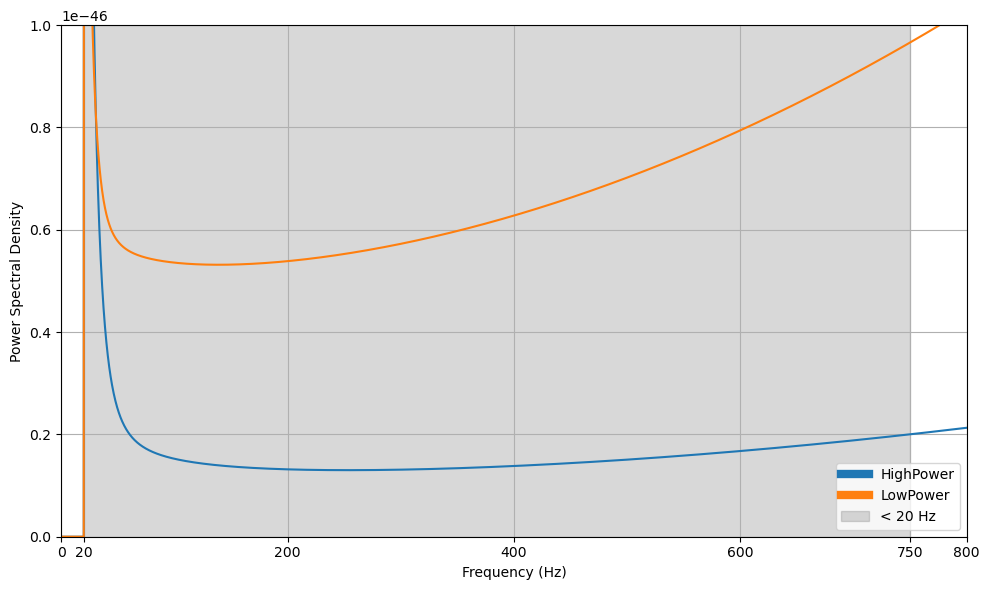

In [19]:
import matplotlib.pyplot as pp
import pycbc.psd

# List the available analytic psds
print(pycbc.psd.get_lalsim_psd_list())

delta_f = 1.0 / 4
flen = int(1024 / delta_f)
low_frequency_cutoff = 20.0

pp.figure(figsize=(10, 6))

# Generate two PSDs
p1 = pycbc.psd.aLIGOZeroDetHighPower(flen, delta_f, low_frequency_cutoff)
p2 = pycbc.psd.from_string('aLIGOZeroDetLowPower', flen, delta_f, low_frequency_cutoff)

# Plot the PSDs
pp.plot(p1.sample_frequencies, p1, label='HighPower')
pp.plot(p2.sample_frequencies, p2, label='LowPower')

# Set shading thresholds
n = 20   # lower frequency limit
m = 750  # upper frequency limit

# Shade the regions
pp.axvspan(n, m, color='gray', alpha=0.3, label=f'< {n} Hz')
#pp.axvspan(m, p1.sample_frequencies[-1], color='gray', alpha=0.3, label=f'> {m} Hz')

# Add ticks at n and m
xticks = list(pp.xticks()[0])  # Get current x-ticks
for freq in [n, m]:
    if freq not in xticks:
        xticks.append(freq)
xticks = sorted(xticks)  # Sort them for visual consistency
pp.xticks(xticks)         # Set updated ticks

# Final touches
pp.xlabel("Frequency (Hz)")
pp.ylabel("Power Spectral Density")
pp.ylim(0, 1*(10**-46))
pp.xlim(0, 800)
pp.legend()
pp.grid(True)
pp.tight_layout()
pp.savefig('PSD.png', format="png", transparent=True)
pp.show()

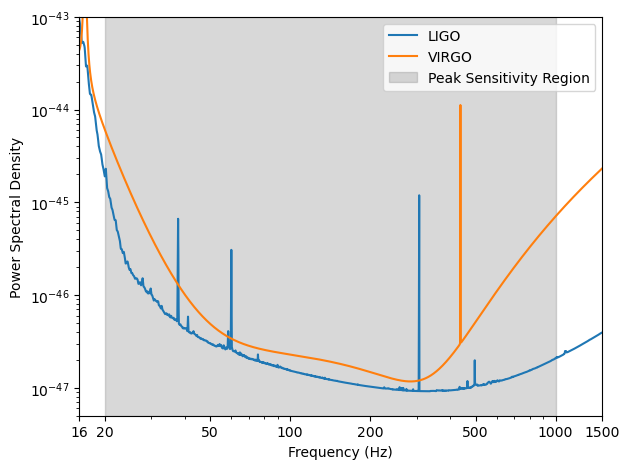

In [39]:
import matplotlib.pyplot as pp
import pycbc.psd

aLIGO = np.genfromtxt("./aLIGO_O4_high_psd.txt")
AdV = np.genfromtxt("AdV_psd.txt")


pp.loglog(aLIGO[:,0], aLIGO[:,1], label='LIGO')
pp.loglog(AdV[:,0], AdV[:,1], label='VIRGO')
pp.xlim(16, 1500)
pp.ylim(5*10**(-48), 10**(-43))
pp.xlabel("Frequency (Hz)")
pp.ylabel("Power Spectral Density")
pp.xticks([16, 20, 50, 100, 200, 500, 1000, 1500], [16, 20, 50, 100, 200, 500, 1000, 1500])
n, m = 20, 1000
pp.axvspan(n, m, color='gray', alpha=0.3, label='Peak Sensitivity Region')
pp.legend(handler_map=None)
pp.tight_layout()
pp.savefig('./plots/PSD.pdf', format="pdf", transparent=True)
pp.show()

In [ ]:
# The peaks account for various things like the AC power supply, harmonic modes from the suspension of the detectors etc...